<a href="https://colab.research.google.com/github/liadekel/analyzing-big-data/blob/master/HW_9_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Homework Assignment 9

**Question 1:** Select a short video with at least 3 persons and create a new movie from this video with a face tracker (each person’s face needs to be tracked by a rectangle of a different color) (50pt). See, for example, the video in: https://github.com/ageitgey/face_recognition

**Bonus:** Select a video with at least two animals (dog/cat/lion/tiger...), and create a video with an animal tracker (10pt).

In [1]:
!pip install turicreate
!pip install youtube-dl
!pip install opencv-python
!pip install face_recognition
!pip install ipython

     |████████████████████████████████| 91.9MB 47kB/s 
     |████████████████████████████████| 3.4MB 41.3MB/s 
     |████████████████████████████████| 86.3MB 35kB/s 
     |████████████████████████████████| 327kB 38.4MB/s 
     |████████████████████████████████| 3.8MB 38.4MB/s 
     |████████████████████████████████| 450kB 38.9MB/s 
  Created wheel for resampy: filename=resampy-0.2.1-cp36-none-any.whl size=320850 sha256=2cbec995ee748a6203beb59bb542d9e5f73bcb74d7d47243dcdfdee06d5479fb
  Stored in directory: /root/.cache/pip/wheels/ff/4f/ed/2e6c676c23efe5394bb40ade50662e90eb46e29b48324c5f9b
  Created wheel for gast: filename=gast-0.2.2-cp36-none-any.whl size=7540 sha256=18c43f582bc97b2c6590e0c6f45a1abb6525b788e5a5eafca454c6c49d965e9c
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built resampy gast
ERROR: tensorflow-probability 0.10.0 has requirement gast>=0.3.2, but you'll have gast 0.2.2 which is incompatible.
  Fo

In [2]:
!pip install tensorflow

In [3]:
# Installing the Kaggle package
import json
!pip install kaggle 
!mkdir /root/.kaggle/

#Important Note: complete this with your own key - after running this for the first time remmember to **remove** your API_KEY
api_token = {"username":"liaddekel","key":"bf0297555b2915c6c31a8f6579de9483"}

# creating kaggle.json file with the personal API-Key details 
# You can also put this file on your Google Drive
with open('/root/.kaggle/kaggle.json', 'w') as file:
  json.dump(api_token, file)
!chmod 600 /root/.kaggle/kaggle.json

In [4]:
! git clone https://github.com/intel-iot-devkit/sample-videos
! ls -l sample-videos/

Cloning into 'sample-videos'...
remote: Enumerating objects: 118, done.
remote: Total 118 (delta 0), reused 0 (delta 0), pack-reused 118
Receiving objects: 100% (118/118), 171.30 MiB | 11.38 MiB/s, done.
Resolving deltas: 100% (39/39), done.
total 156684
-rw-r--r-- 1 root root  9285374 Jun  8 09:35 bolt-detection.mp4
-rw-r--r-- 1 root root 16113270 Jun  8 09:35 bolt-multi-size-detection.mp4
-rw-r--r-- 1 root root   504961 Jun  8 09:35 bottle-detection.mp4
-rw-r--r-- 1 root root  2811553 Jun  8 09:35 car-detection.mp4
-rw-r--r-- 1 root root 13548133 Jun  8 09:35 classroom.mp4
-rw-r--r-- 1 root root  9406029 Jun  8 09:35 face-demographics-walking-and-pause.mp4
-rw-r--r-- 1 root root  6406124 Jun  8 09:35 face-demographics-walking.mp4
-rw-r--r-- 1 root root 17760065 Jun  8 09:35 fruit-and-vegetable-detection.mp4
-rw-r--r-- 1 root root 16788193 Jun  8 09:35 head-pose-face-detection-female-and-male.mp4
-rw-r--r-- 1 root root 15628037 Jun  8 09:35 head-pose-face-detection-female.mp4
-rw-r--r

In [5]:
import cv2
import face_recognition

VIDEO_PATH = "./sample-videos/preview/face-demographics-walking-and-pause.gif"

# Open the input movie file
input_movie = cv2.VideoCapture(VIDEO_PATH)
length = int(input_movie.get(cv2.CAP_PROP_FRAME_COUNT))

length

41

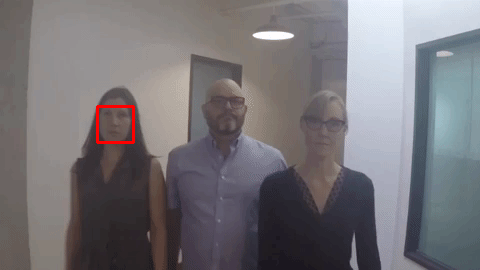

Writing frame 1 / 41


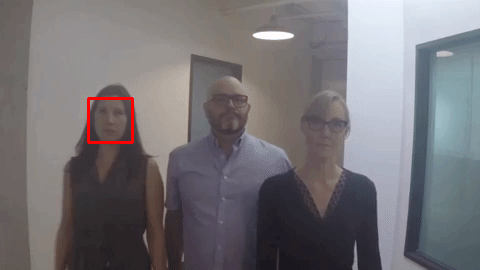

Writing frame 2 / 41


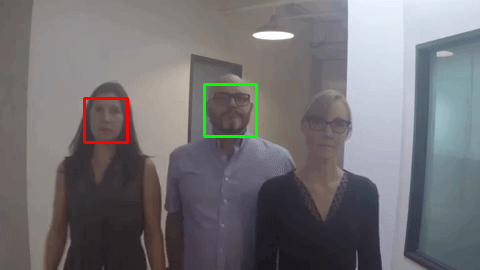

Writing frame 3 / 41


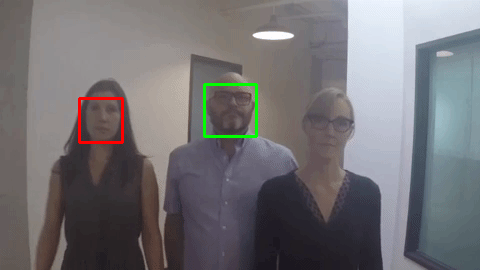

Writing frame 4 / 41


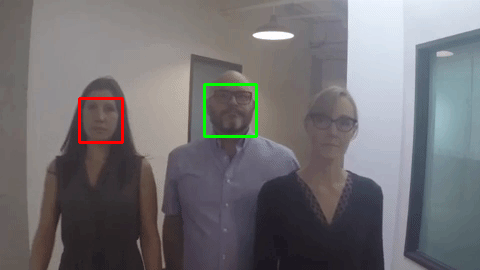

Writing frame 5 / 41


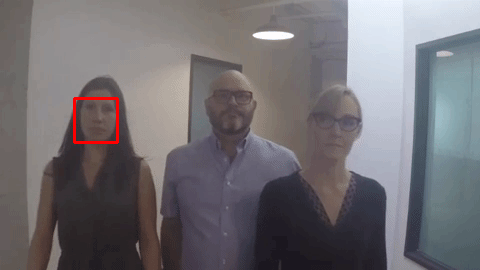

Writing frame 6 / 41


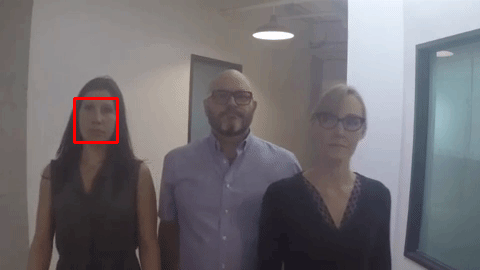

Writing frame 7 / 41


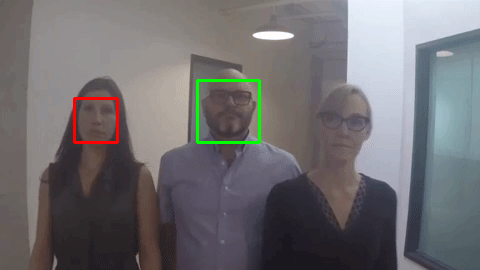

Writing frame 8 / 41


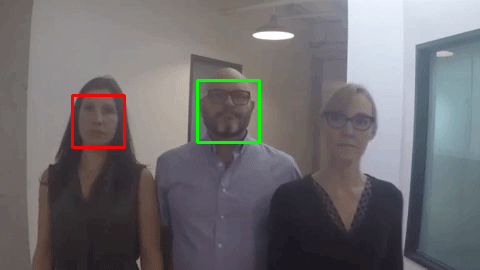

Writing frame 9 / 41


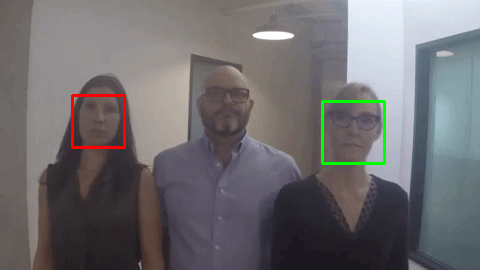

Writing frame 10 / 41


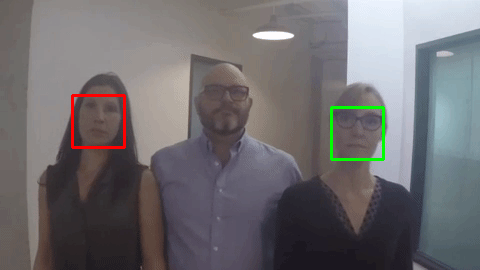

Writing frame 11 / 41


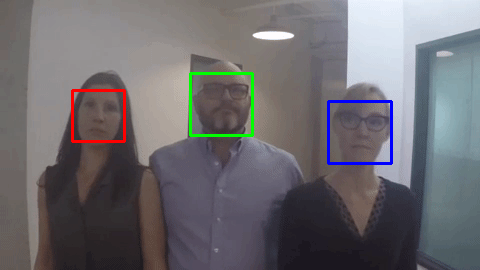

Writing frame 12 / 41


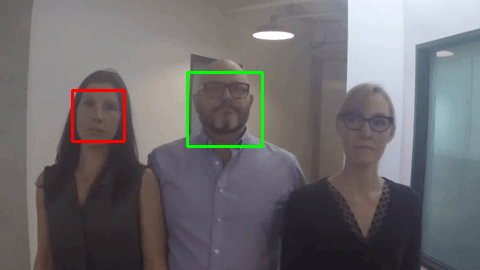

Writing frame 13 / 41


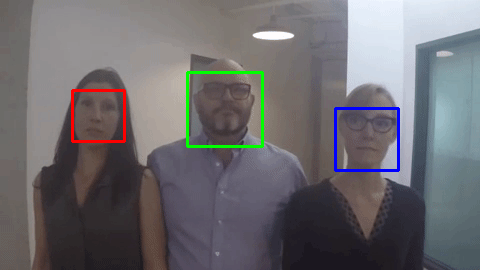

Writing frame 14 / 41


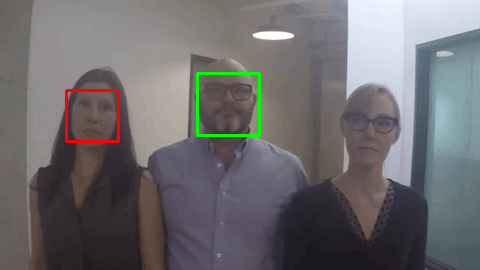

Writing frame 15 / 41


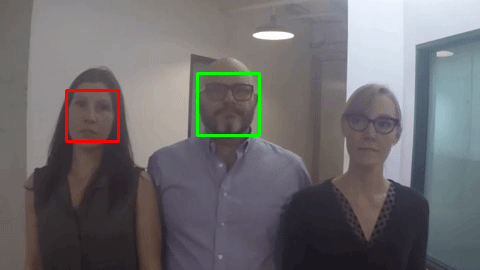

Writing frame 16 / 41


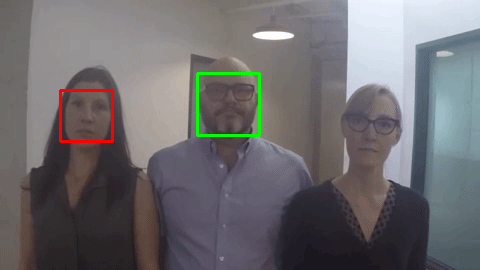

Writing frame 17 / 41


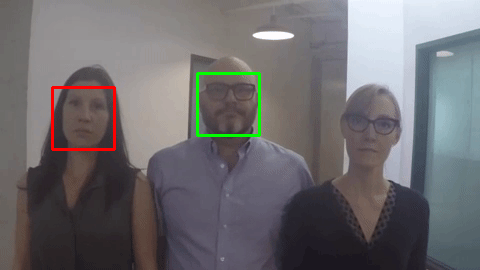

Writing frame 18 / 41


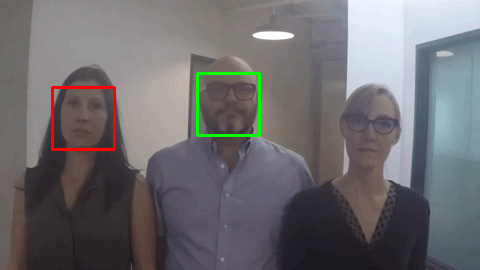

Writing frame 19 / 41


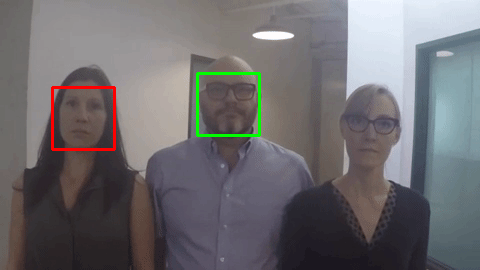

Writing frame 20 / 41


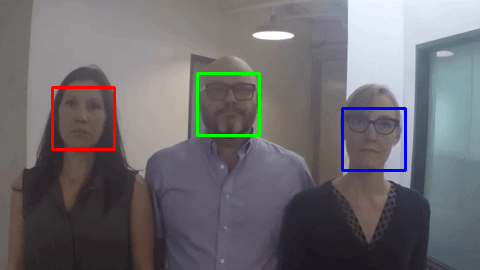

Writing frame 21 / 41


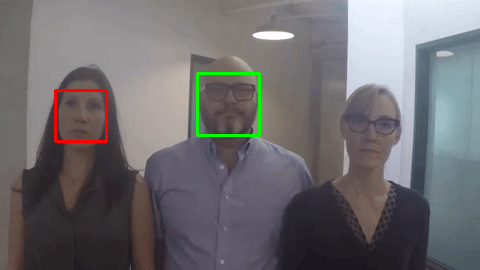

Writing frame 22 / 41


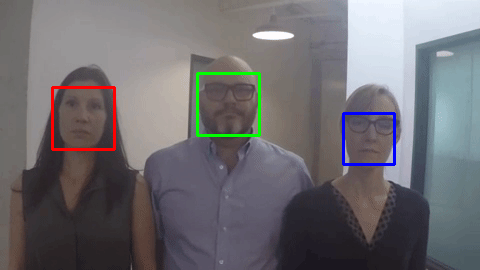

Writing frame 23 / 41


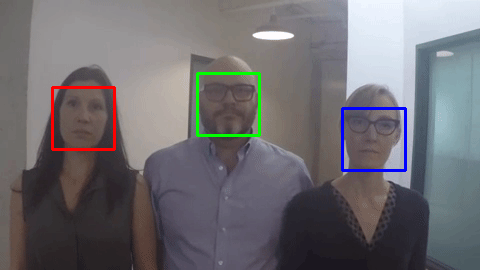

Writing frame 24 / 41


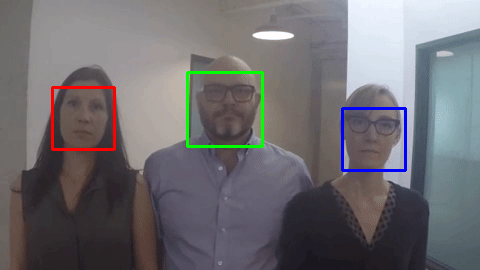

Writing frame 25 / 41


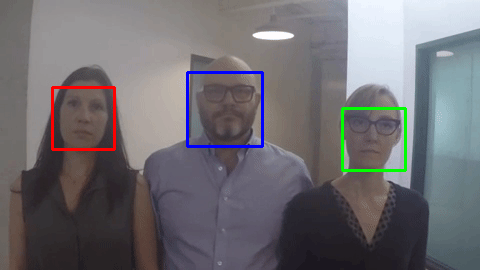

Writing frame 26 / 41


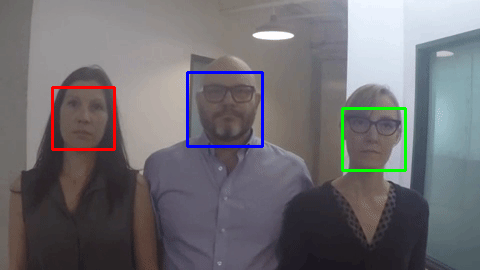

Writing frame 27 / 41


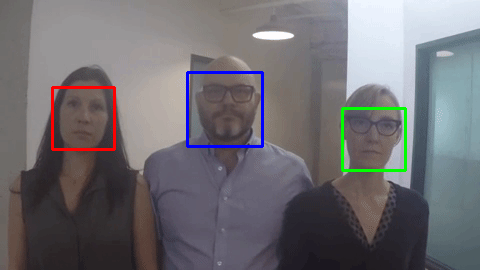

Writing frame 28 / 41


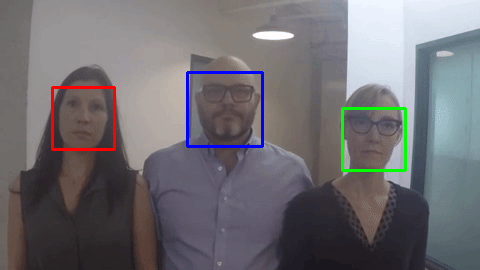

Writing frame 29 / 41


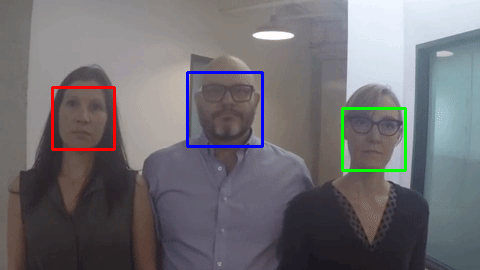

Writing frame 30 / 41


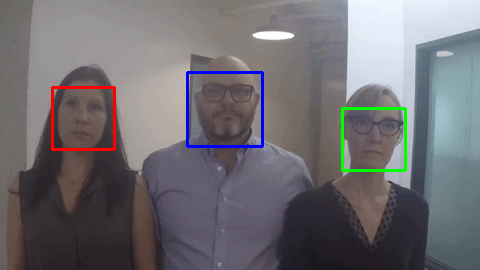

Writing frame 31 / 41


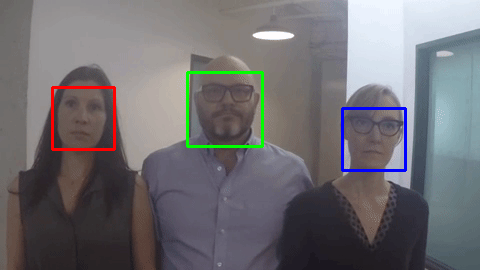

Writing frame 32 / 41


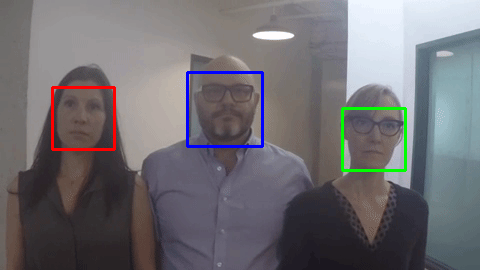

Writing frame 33 / 41


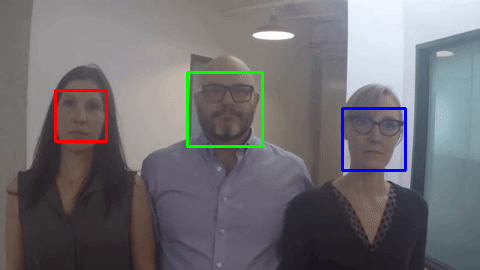

Writing frame 34 / 41


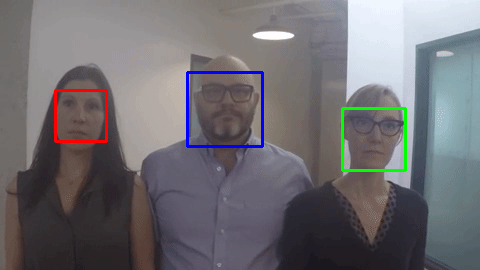

Writing frame 35 / 41


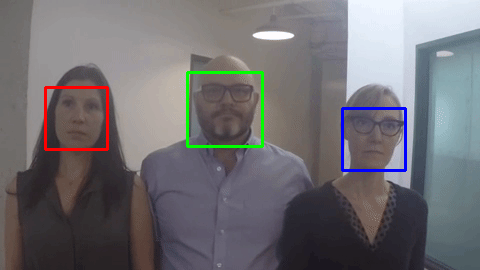

Writing frame 36 / 41


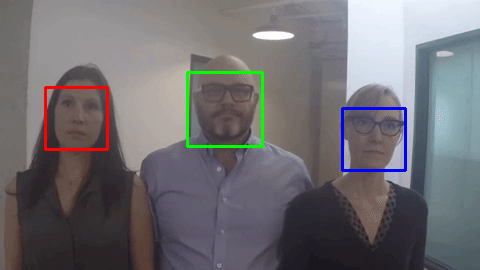

Writing frame 37 / 41


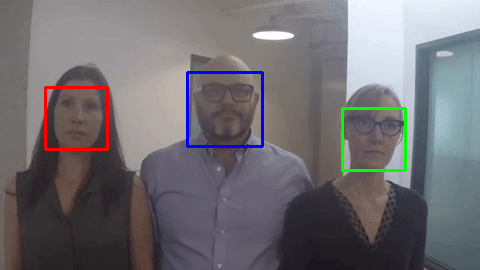

Writing frame 38 / 41


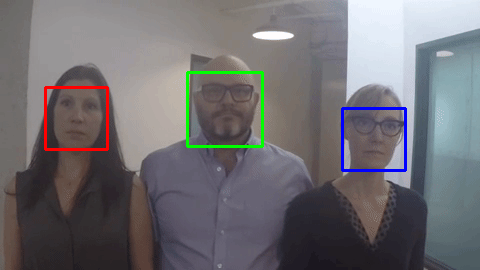

Writing frame 39 / 41


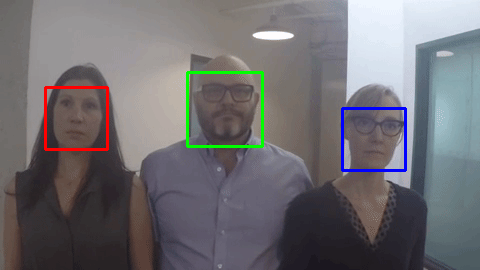

Writing frame 40 / 41


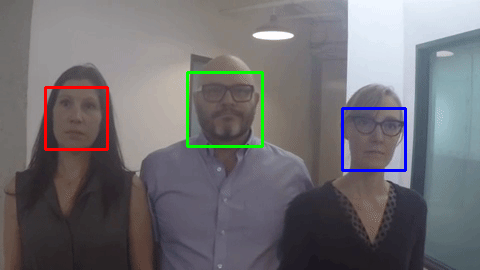

Writing frame 41 / 41
out


In [6]:
# Initialize some variables
from IPython.display import clear_output, Image, display, HTML
import base64

def arrayShow (imageArray):
    ret, png = cv2.imencode('.png', imageArray)
    encoded = base64.b64encode(png)
    return Image(data=encoded.decode('ascii'))

colors = [
     (0,0,255),
     (0,255,0),
     (255,0,0)   
]
face_locations = []
face_encodings = []
face_names = []
frame_number = 0

height, width, layers = 0,0,0
frames = []

while True:
    # Grab a single frame of video
    ret, frame = input_movie.read()
    frame_number += 1

    
    # Quit when the input video file ends
    if not ret:
        print("out")
        break

    height, width, layers = frame.shape
    # Convert the image from BGR color (which OpenCV uses) to RGB color (which face_recognition uses)
    rgb_frame = frame[:, :, ::-1]

    # Find all the faces and face encodings in the current frame of video
    face_locations = face_recognition.face_locations(rgb_frame)
    face_encodings = face_recognition.face_encodings(rgb_frame, face_locations)

    if face_locations:
        for i, l in enumerate(face_locations):
            top, right, bottom, left = l
            # Draw a box around the face
            cv2.rectangle(frame, (left, top), (right, bottom), colors[i], 2)
    
    frames.append(frame)
    img = arrayShow(frame)
    display(img)
    # Write the resulting image to the output video file
    print("Writing frame {} / {}".format(frame_number, length))

# All done!

# Create an output movie file (make sure resolution/frame rate matches input video!)
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
output_movie = cv2.VideoWriter("output.mp4", fourcc, 20, (width, height))

for frame in frames:
    output_movie.write(frame)

output_movie.release()
cv2.destroyAllWindows()

In [7]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('output.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

# I'm not sure why the video is not playing well in the colab.
# When downloaded from the file browser to the computer it works great :)

**Question 2:** Select a collection of connected images. Create a graph of the links among images or objects in images (42pt). Use graph algorithms to discover interesting insights regarding the images. See, for example, [Figure 2](https://arxiv.org/pdf/1509.00568.pdf) (8pt).

In [8]:
!mkdir ./datasets
!mkdir ./datasets/pokemon

# download the dataset from Kaggle and unzip it
!kaggle datasets download vishalsubbiah/pokemon-images-and-types -p ./datasets/pokemon
!unzip ./datasets/pokemon/*.zip  -d ./datasets/pokemon/

  0% 0.00/2.47M [00:00<?, ?B/s]
100% 2.47M/2.47M [00:00<00:00, 81.9MB/s]
Archive:  ./datasets/pokemon/pokemon-images-and-types.zip
  inflating: ./datasets/pokemon/images/images/abomasnow.png  
  inflating: ./datasets/pokemon/images/images/abra.png  
  inflating: ./datasets/pokemon/images/images/absol.png  
  inflating: ./datasets/pokemon/images/images/accelgor.png  
  inflating: ./datasets/pokemon/images/images/aegislash-blade.png  
  inflating: ./datasets/pokemon/images/images/aerodactyl.png  
  inflating: ./datasets/pokemon/images/images/aggron.png  
  inflating: ./datasets/pokemon/images/images/aipom.png  
  inflating: ./datasets/pokemon/images/images/alakazam.png  
  inflating: ./datasets/pokemon/images/images/alomomola.png  
  inflating: ./datasets/pokemon/images/images/altaria.png  
  inflating: ./datasets/pokemon/images/images/amaura.png  
  inflating: ./datasets/pokemon/images/images/ambipom.png  
  inflating: ./datasets/pokemon/images/images/amoonguss.png  
  inflating: ./data

In [9]:
import turicreate as tc

sf = tc.image_analysis.load_images(f"./datasets/pokemon/images/images/", with_path=True)
sf['pokemon'] = sf['path'].apply(lambda p: p.split('/')[-1].split('.')[0])
sf

path,image,pokemon
/content/datasets/pokemon/images/images/abomas ...,Height: 120 Width: 120,abomasnow
/content/datasets/pokemon/images/images/abra.png ...,Height: 120 Width: 120,abra
/content/datasets/pokemon/images/images/absol.png ...,Height: 120 Width: 120,absol
/content/datasets/pokemon/images/images/accelg ...,Height: 120 Width: 120,accelgor
/content/datasets/pokemon/images/images/aegisl ...,Height: 120 Width: 120,aegislash-blade
/content/datasets/pokemon/images/images/aeroda ...,Height: 120 Width: 120,aerodactyl
/content/datasets/pokemon/images/images/aggron ...,Height: 120 Width: 120,aggron
/content/datasets/pokemon/images/images/aipom.png ...,Height: 120 Width: 120,aipom
/content/datasets/pokemon/images/images/alakaz ...,Height: 120 Width: 120,alakazam
/content/datasets/pokemon/images/images/alomom ...,Height: 120 Width: 120,alomomola


In [10]:
from turicreate.toolkits import _image_feature_extractor, _pre_trained_models

def get_images_features_vector(dataset, target, feature="image", model_name='resnet-50'):
    #ptModel = _pre_trained_models.MODELS[model_name]()
    ptModel = tc.toolkits._pre_trained_models.ResNetImageClassifier()
    feature_extractor = tc.toolkits._image_feature_extractor._create_feature_extractor(model_name)
    extracted_features = tc.SFrame({
        target: dataset[target],
        '__image_features__': feature_extractor.extract_features(dataset, feature),
        })
    dataset['image_features'] = extracted_features['__image_features__']
    return dataset

sf = get_images_features_vector(sf, 'pokemon')
sf

Instructions for updating:
non-resource variables are not supported in the long term
Download completed: /var/tmp/model_cache/resnet-50-TuriCreate-6.0.h5


path,image,pokemon,image_features
/content/datasets/pokemon/images/images/abomas ...,Height: 120 Width: 120,abomasnow,"[0.891204833984375, 0.0,1.1885868310928345, ..."
/content/datasets/pokemon/images/images/abra.png ...,Height: 120 Width: 120,abra,"[0.31177547574043274,0.0, 0.690824031829834, ..."
/content/datasets/pokemon/images/images/absol.png ...,Height: 120 Width: 120,absol,"[0.20677340030670166,0.0, 2.4104464054107666, ..."
/content/datasets/pokemon/images/images/accelg ...,Height: 120 Width: 120,accelgor,"[0.37132492661476135,0.0, 0.7287037372589111, ..."
/content/datasets/pokemon/images/images/aegisl ...,Height: 120 Width: 120,aegislash-blade,"[0.4229261875152588, 0.0,0.5956622362136841, ..."
/content/datasets/pokemon/images/images/aeroda ...,Height: 120 Width: 120,aerodactyl,"[0.2836500108242035, 0.0,1.0402036905288696, ..."
/content/datasets/pokemon/images/images/aggron ...,Height: 120 Width: 120,aggron,"[0.20393186807632446,0.0, 1.8211379051208496, ..."
/content/datasets/pokemon/images/images/aipom.png ...,Height: 120 Width: 120,aipom,"[0.29814302921295166,0.0, 0.5132847428321838, ..."
/content/datasets/pokemon/images/images/alakaz ...,Height: 120 Width: 120,alakazam,"[0.2687125504016876, 0.0,0.21680457890033722, ..."
/content/datasets/pokemon/images/images/alomom ...,Height: 120 Width: 120,alomomola,"[0.12615062296390533,0.0, 1.872178316116333, ..."


In [18]:
model = tc.image_similarity.create(sf)
model.query(sf[100:101], k=10)

Performing feature extraction on resized images...
Completed  64/809
Completed 128/809
Completed 192/809
Completed 256/809
Completed 320/809
Completed 384/809
Completed 448/809
Completed 512/809
Completed 576/809
Completed 640/809
Completed 704/809
Completed 768/809
Completed 809/809


Starting brute force nearest neighbors model training.

Validating distance components.

Initializing model data.

Initializing distances.

Done.

Performing feature extraction on resized images...
Completed 1/1


Starting pairwise querying.

+--------------+---------+-------------+--------------+

| Query points | # Pairs | % Complete. | Elapsed Time |

+--------------+---------+-------------+--------------+

| 0            | 1       | 0.123609    | 26.596ms     |

| Done         |         | 100         | 79.01ms      |

+--------------+---------+-------------+--------------+

query_label,reference_label,distance,rank
0,100,0.0,1
0,595,17.071080412191282,2
0,652,17.682125933110438,3
0,754,18.03215714020603,4
0,550,18.446223188539943,5
0,224,18.453438311111945,6
0,801,18.506039604616323,7
0,143,18.76403589459582,8
0,44,18.907576226416104,9
0,747,18.9314655724315,10


In [13]:
similarity_graph = model.similarity_graph(k=5)
similarity_graph.summary()

Starting blockwise similarity graph construction.

max rows per data block: 6207

number of reference data blocks: 2

+---------+-------------+--------------+

| # Pairs | % Complete. | Elapsed Time |

+---------+-------------+--------------+

| 326836  | 66.42       | 249.515ms    |

| 492075  | 100         | 403.912ms    |

+---------+-------------+--------------+

{'num_edges': 4045, 'num_vertices': 809}

In [14]:
import networkx as nx
import matplotlib.image as mpimg

g = nx.Graph()
for v in similarity_graph.vertices['__id']:
    img=mpimg.imread(sf[v]['path'])
    g.add_node(v, image=img, attr_dict={'path':sf[v]['path'], 'pokemon': sf[v]['pokemon']})
for e in similarity_graph.edges:
    g.add_edge(e["__src_id"], e["__dst_id"])
nx.info(g)

'Name: \nType: Graph\nNumber of nodes: 809\nNumber of edges: 3437\nAverage degree:   8.4969'

In [0]:
from networkx.algorithms.community import greedy_modularity_communities
c = list(greedy_modularity_communities(g))
d = {i: len(c[i]) for i in range(len(c))}

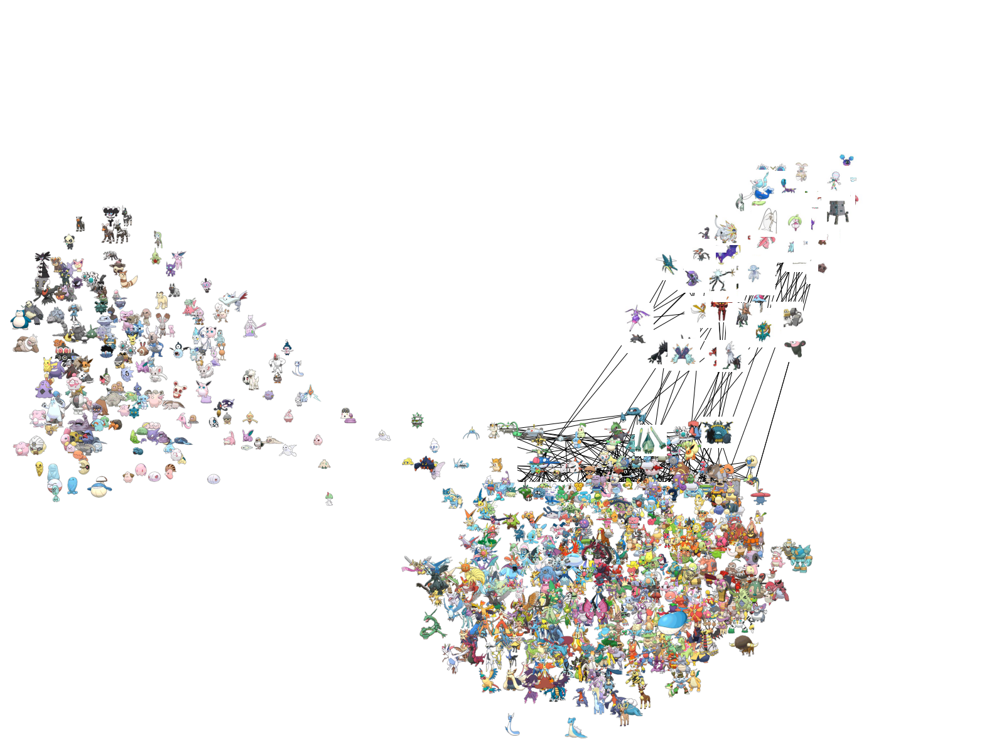

In [16]:
import matplotlib.pyplot as plt

# g = g.subgraph(c[3])
fig=plt.figure(figsize=(14,14))
ax=plt.subplot(111)
ax.set_aspect('equal')
pos=nx.spring_layout(g)
nx.draw_networkx_edges(g,pos,ax=ax)

trans=ax.transData.transform
trans2=fig.transFigure.inverted().transform

piesize=0.05 # this is the image size
p2=piesize/2.0
for n in g:
    xx,yy=trans(pos[n]) # figure coordinates
    xa,ya=trans2((xx,yy)) # axes coordinates
    a = plt.axes([xa-p2,ya-p2, piesize, piesize])
    a.set_aspect('equal')
    a.imshow(g.nodes[n]['image'])
    a.axis('off')
ax.axis('off')
plt.show()

In [17]:
import matplotlib.pyplot as plt
plt.figure(figsize=(14,14))

# h = g.subgraph(c[3])
# nx.draw_kamada_kawai(h, with_labels=True)
h = g

n_csv = ["id,pokemon,path"]
for n in h.nodes():
    path = h.nodes[n]['attr_dict']['path'].split("images/images/")[1]
    path = f"http://127.0.0.1:8000/{path}" #ask me in class why I using http:// :)
    pokemon = h.nodes[n]['attr_dict']['pokemon']
    n_csv.append(f"{n},{pokemon},{path}")
open('./pokemon_vertices.csv', "w").write("\n".join(n_csv))             
e_csv = ["src,dst"]
for e1,e2 in h.edges():
    e_csv.append(f"{e1},{e2}")
open('./pokemon_edges.csv', "w").write("\n".join(e_csv))             

26633

<Figure size 1008x1008 with 0 Axes>

Macro image with cytoscape

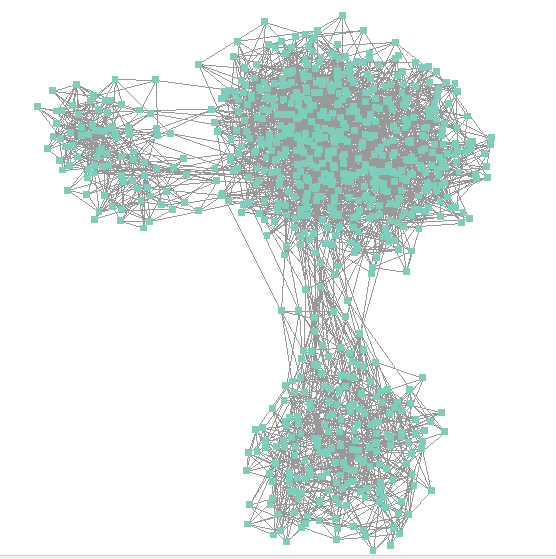

Micro image with cytoscape
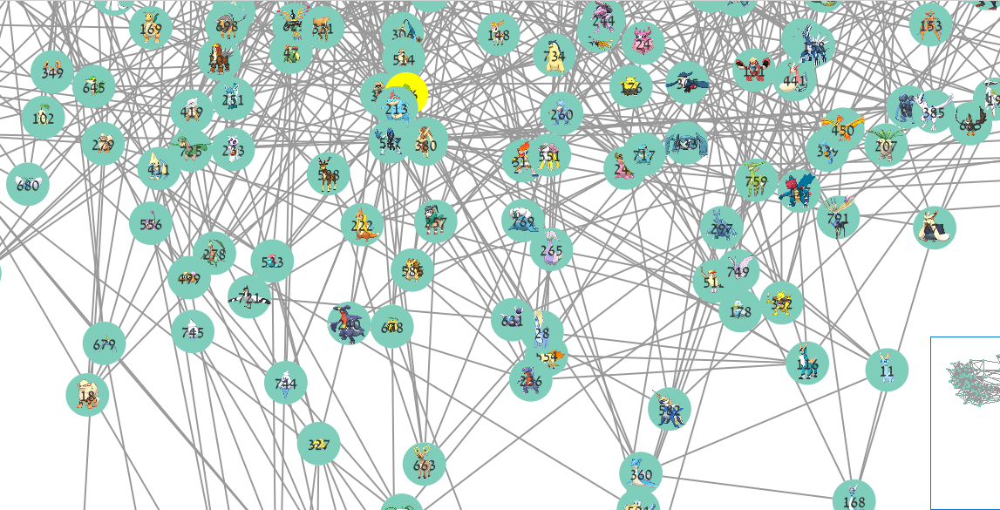

(155) dewott, 0.006049802762681294


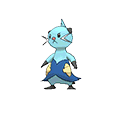

(752) vespiquen, 0.005100714355979977


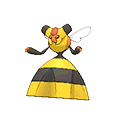

(620) shuppet, 0.005036767929343101


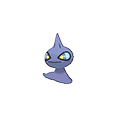

(525) politoed, 0.004564540501268948


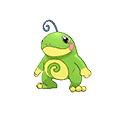

(147) dedenne, 0.0045417077309477015


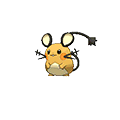

(772) weavile, 0.004358491937158814


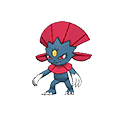

(391) luxio, 0.003929290340008688


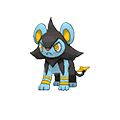

(571) rockruff, 0.0037800250116989003


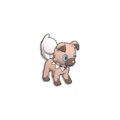

(351) kricketune, 0.003756332965696451


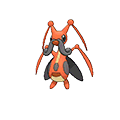

(295) heliolisk, 0.003688169705631384


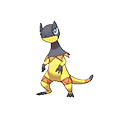

(626) simisear, 0.0035477985143488404


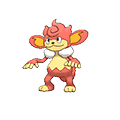

(224) florges, 0.003437023278764895


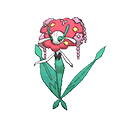

(723) treecko, 0.003350203297077614


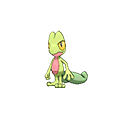

(806) zubat, 0.0032844728237463807


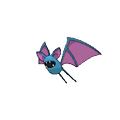

(498) pansear, 0.003250384401742149


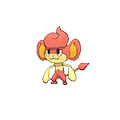

(761) volbeat, 0.003244893281926958


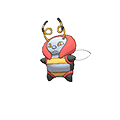

(696) tapu-koko, 0.0032366416616685916


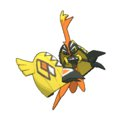

(617) shinx, 0.0032344790265209137


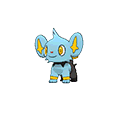

(628) skiddo, 0.003234329682717403


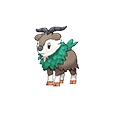

(231) froakie, 0.003191018220427586


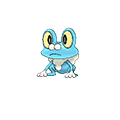

(225) flygon, 0.0031847210602197746


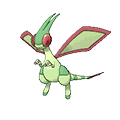

(73) bulbasaur, 0.0031397744331238503


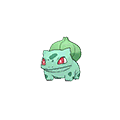

(699) teddiursa, 0.0030906001215617344


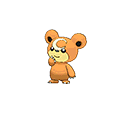

(226) fomantis, 0.00307292229423345


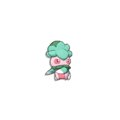

(539) psyduck, 0.0030518134397016306


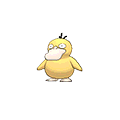

(644) sneasel, 0.003045421972596307


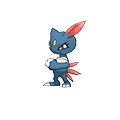

(625) simisage, 0.0030147111905841533


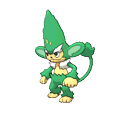

(322) jangmo-o, 0.0029698306012329416


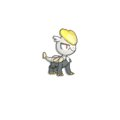

(293) heatmor, 0.002887489152792271


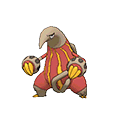

(435) metapod, 0.0028333854259655782


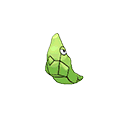

(30) axew, 0.00271293494004384


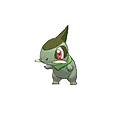

(199) emolga, 0.0026946456901274537


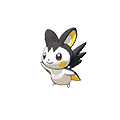

(459) munchlax, 0.0026943517379876387


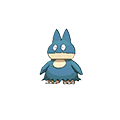

(507) phanpy, 0.0026842615027351524


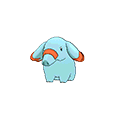

(347) komala, 0.0026421109835536942


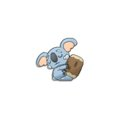

(409) manaphy, 0.0026405433393077433


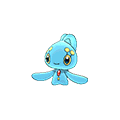

(401) magmar, 0.0026249987287145626


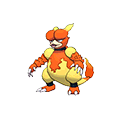

(624) simipour, 0.0026245507030668506


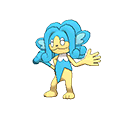

(520) pineco, 0.002624508145809567


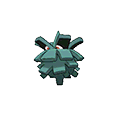

(487) oranguru, 0.002619474668790149


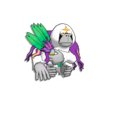

(583) sandile, 0.0025739082420223724


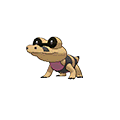

(574) roserade, 0.0025695256552307295


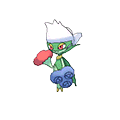

(194) electrike, 0.0025630591660660168


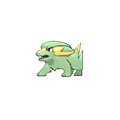

(600) seel, 0.0025091511811967124


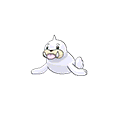

(198) emboar, 0.0024512461770468588


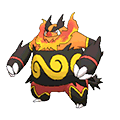

(670) steenee, 0.0023769851896407864


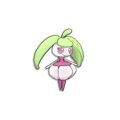

(34) bagon, 0.0023722216721651667


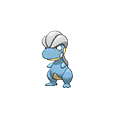

(213) feraligatr, 0.002367903684892498


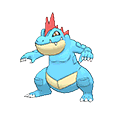

(397) magby, 0.002367038755614458


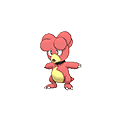

(736) tyrantrum, 0.002360242557510759


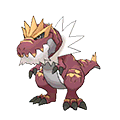

(54) bisharp, 0.0023591015167072566


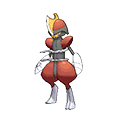

(80) cacturne, 0.002355487060241829


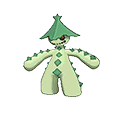

(653) spearow, 0.0023272548215237244


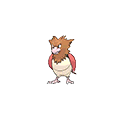

(103) chimchar, 0.0023174866705410278


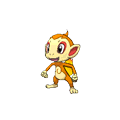

(562) relicanth, 0.002311507040295447


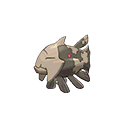

(51) bibarel, 0.0023107056490876436


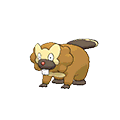

(367) ledian, 0.0022982349987642784


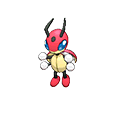

(380) lopunny, 0.002257270117784587


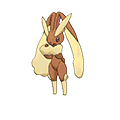

(516) pignite, 0.002246361250562552


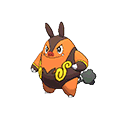

(175) drilbur, 0.0022090488445853933


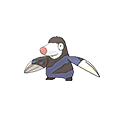

(490) pachirisu, 0.0022052920448872213


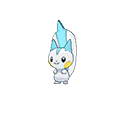

(796) yungoos, 0.0021820987695929757


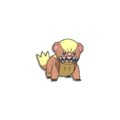

(460) munna, 0.0021734837007235308


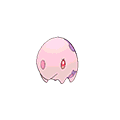

(612) shellos, 0.002151318915680297


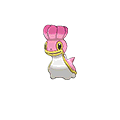

(649) snubbull, 0.0021480725563104153


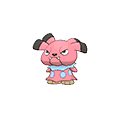

(746) vanilluxe, 0.002143254614771018


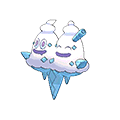

(3) accelgor, 0.00214134193628347


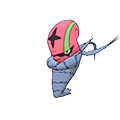

(337) kecleon, 0.0021377690869417766


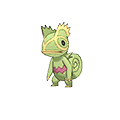

(66) breloom, 0.002127896859726063


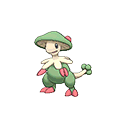

(750) venonat, 0.0021219869299631553


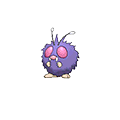

(451) monferno, 0.0021080783225067147


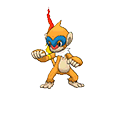

(593) scrafty, 0.0020860956201607856


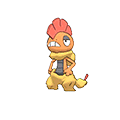

(803) zigzagoon, 0.0020799325592231253


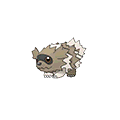

(477) noibat, 0.002076924532536079


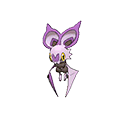

(468) nidoran-f, 0.002047765870074531


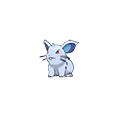

(618) shroomish, 0.0020393591302046536


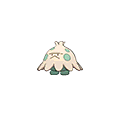

(470) nidorina, 0.0020389669075117694


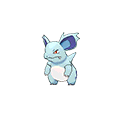

(472) nihilego, 0.0020387911665915837


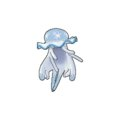

(336) kartana, 0.0020326042715509366


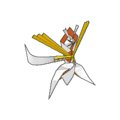

(112) clefable, 0.0020217866495134493


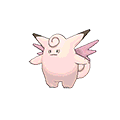

(502) patrat, 0.002021019752521134


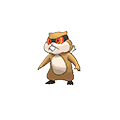

(578) sableye, 0.002018393367080353


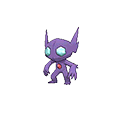

(384) ludicolo, 0.00201811295053647


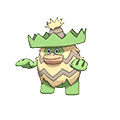

(570) riolu, 0.001990387045135476


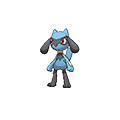

(807) zweilous, 0.0019903390018006844


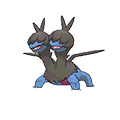

(93) charizard, 0.001973514083544305


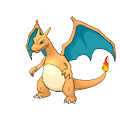

(350) kricketot, 0.0019580894691175483


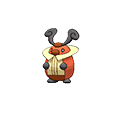

(31) azelf, 0.0019513926456062526


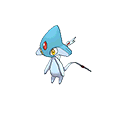

(346) koffing, 0.0019027205776606122


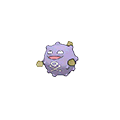

(212) fennekin, 0.0018902935270974691


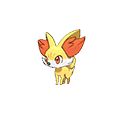

(763) volcarona, 0.0018810546218817233


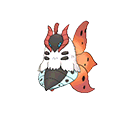

(317) illumise, 0.0018528375496082328


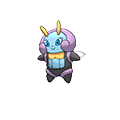

(743) uxie, 0.0018491730850032314


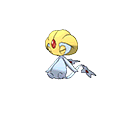

(146) decidueye, 0.0018468326490464187


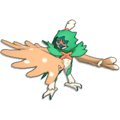

(316) igglybuff, 0.0018442250276404443


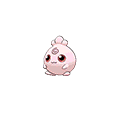

(606) sewaddle, 0.0018420163218769827


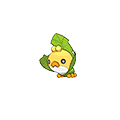

(275) grimer, 0.0018372410965575641


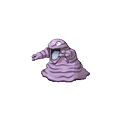

(440) mightyena, 0.0018367014144233208


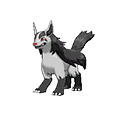

(730) turtwig, 0.001809633405469689


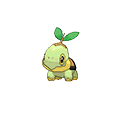

(672) stufful, 0.0018010310887133776


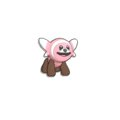

(689) sylveon, 0.001789594986403262


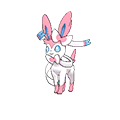

(715) torracat, 0.0017861552440500044


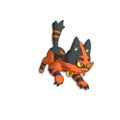

(389) lurantis, 0.0017796611504986262


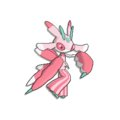

(418) marill, 0.0017769396937392951


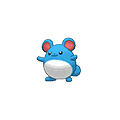

(660) spritzee, 0.0017717865506061215


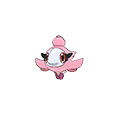

(63) bounsweet, 0.0017671626139271895


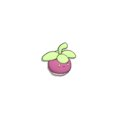

(217) flaaffy, 0.0017560238992800916


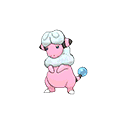

(134) crobat, 0.0017534560864501162


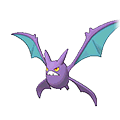

(706) timburr, 0.0017498202218568166


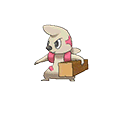

(138) cubchoo, 0.00173586001800055


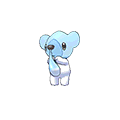

(141) cyndaquil, 0.0017346991401269592


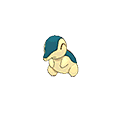

(260) golduck, 0.0017305450355085755


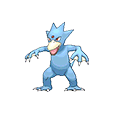

(243) gastrodon, 0.0017232490923497232


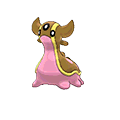

(329) jynx, 0.0017206039973179045


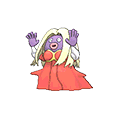

(479) nosepass, 0.00172027523961233


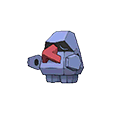

(371) liepard, 0.0017169400346205546


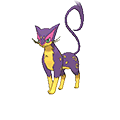

(530) poochyena, 0.0017168487531075052


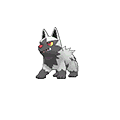

(724) trevenant, 0.0017094298806103992


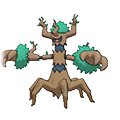

(186) dustox, 0.0017000324567846368


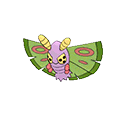

(4) aegislash-blade, 0.0016992944253792603


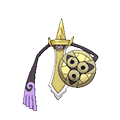

(27) audino, 0.0016881267253709355


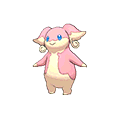

(738) tyrunt, 0.0016842128136814003


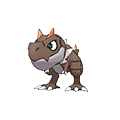

(156) dewpider, 0.0016748587423569706


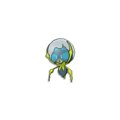

(573) roselia, 0.0016665402249594935


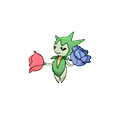

(577) rufflet, 0.0016658135788321475


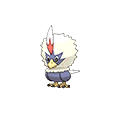

(720) toxicroak, 0.0016586109454280837


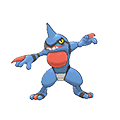

(253) glameow, 0.0016504337681653527


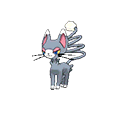

(591) scizor, 0.001642760705188816


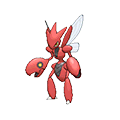

(551) raikou, 0.0016389496473175262


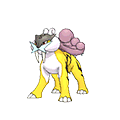

(297) heracross, 0.0016368188253830717


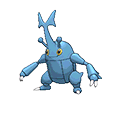

(595) scyther, 0.0016303733859603401


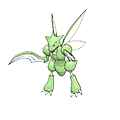

(599) seedot, 0.0016282620003519584


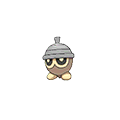

(348) kommo-o, 0.0016221724821467664


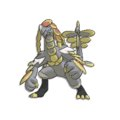

(299) hippopotas, 0.001621785739260973


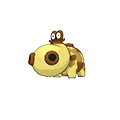

(113) clefairy, 0.0016216609661042654


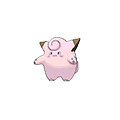

(304) ho-oh, 0.0016206124461793242


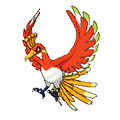

(765) vullaby, 0.0016115466550795723


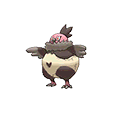

(123) corsola, 0.001608816359317023


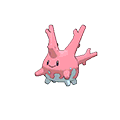

(256) gloom, 0.0016009062485932593


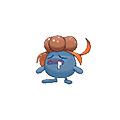

(522) piplup, 0.0016002469842019151


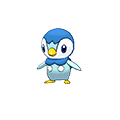

(587) sawk, 0.0015818687004879662


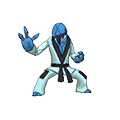

(722) trapinch, 0.0015816803189488587


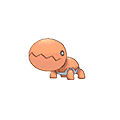

(24) aromatisse, 0.0015710261987163313


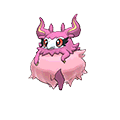

(223) floette, 0.0015708619150028743


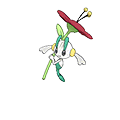

(284) gurdurr, 0.0015704965952373856


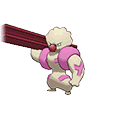

(187) dwebble, 0.0015592932323964886


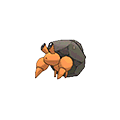

(149) deino, 0.0015584709459800052


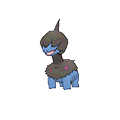

(467) nidoqueen, 0.001556410354321595


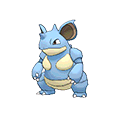

(804) zoroark, 0.0015537491431414426


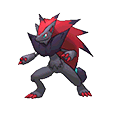

(542) purrloin, 0.0015522340753452136


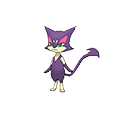

(179) dugtrio, 0.0015514808650823526


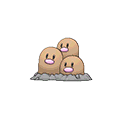

(105) chinchou, 0.0015397019692478548


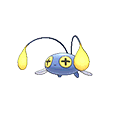

(441) milotic, 0.0015355473112250626


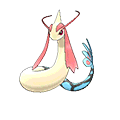

(119) combusken, 0.001531159342840458


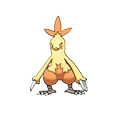

(25) aron, 0.0015157463696690455


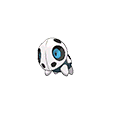

(216) finneon, 0.00150714399571111


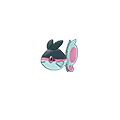

(395) machoke, 0.0015051134224018188


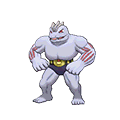

(688) swoobat, 0.0014975883339074425


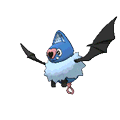

(589) scatterbug, 0.0014941755159600771


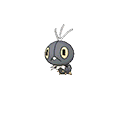

(658) spiritomb, 0.001493616908078305


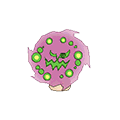

(47) bellossom, 0.0014922602410350318


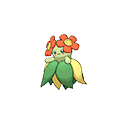

(802) zeraora, 0.0014910677043109058


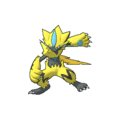

(794) yanma, 0.0014847726361886416


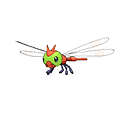

(712) torchic, 0.0014829178596356067


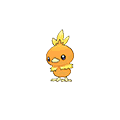

(287) hakamo-o, 0.00148277646384584


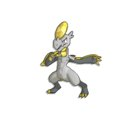

(386) lumineon, 0.0014807681354638833


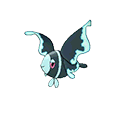

(737) tyrogue, 0.0014739940306677632


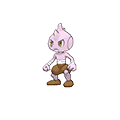

(122) corphish, 0.0014732164680713669


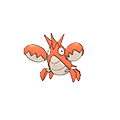

(673) stunfisk, 0.0014657805281718939


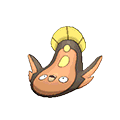

(245) gengar, 0.0014630442751109123


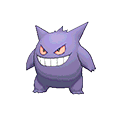

(109) clauncher, 0.0014594993797611405


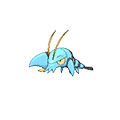

(126) cottonee, 0.0014586642547766882


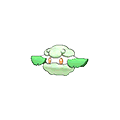

(200) empoleon, 0.0014581720090278045


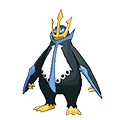

(632) skrelp, 0.0014512933723454852


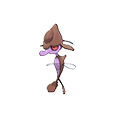

(64) braixen, 0.0014510293987580944


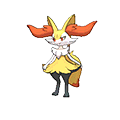

(8) alakazam, 0.0014359450844506963


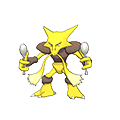

(677) sunflora, 0.001432998638033094


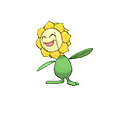

(128) crabrawler, 0.0014321789462831652


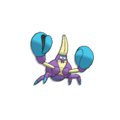

(294) heatran, 0.0014287674253492923


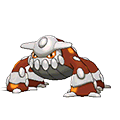

(480) numel, 0.0014238788636003088


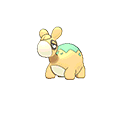

(534) porygon2, 0.0014229015598387004


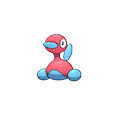

(416) mareanie, 0.001421122776341851


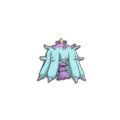

(352) krokorok, 0.0014179802256204695


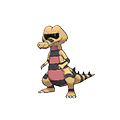

(523) plusle, 0.0014154817759561133


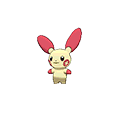

(651) solosis, 0.0014143929903629644


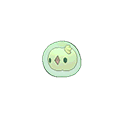

(95) charmander, 0.0014134173257119172


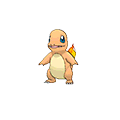

(52) bidoof, 0.0014101076297039976


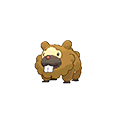

(279) growlithe, 0.0014055371562995416


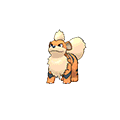

(493) palpitoad, 0.0013924799309676958


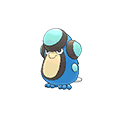

(576) rowlet, 0.0013918546067218794


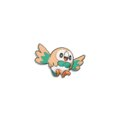

(702) tepig, 0.0013904634072981433


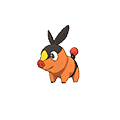

(499) paras, 0.0013838693407912867


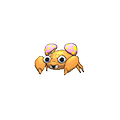

(661) squirtle, 0.0013830297479982556


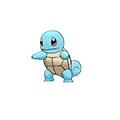

(759) virizion, 0.0013772075681225027


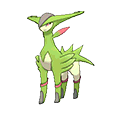

(425) meditite, 0.0013746870958133628


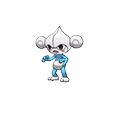

(450) moltres, 0.001374188308701624


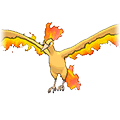

(45) beheeyem, 0.001371890905454289


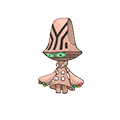

(185) duskull, 0.0013712543147309337


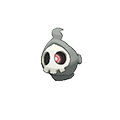

(508) phantump, 0.0013654808827314794


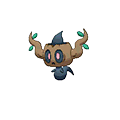

(801) zekrom, 0.0013650087491349548


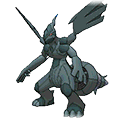

(326) jolteon, 0.0013642932481455357


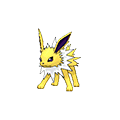

(756) vigoroth, 0.0013625747829029773


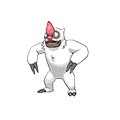

(563) remoraid, 0.0013619264484399526


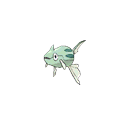

(505) persian, 0.0013618291303058112


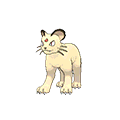

(69) bronzor, 0.0013567865071857394


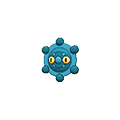

(9) alomomola, 0.0013562382872905924


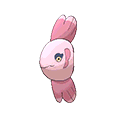

(434) metang, 0.001355839362423508


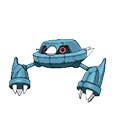

(608) shaymin-land, 0.0013517506563319223


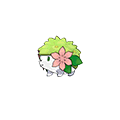

(388) lunatone, 0.0013463507647700293


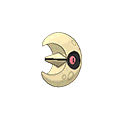

(610) shelgon, 0.0013462681667166523


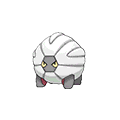

(683) swampert, 0.0013441287373514407


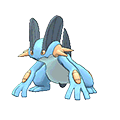

(242) gastly, 0.001343869726483043


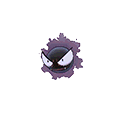

(519) piloswine, 0.001343503453586334


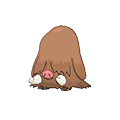

(97) chatot, 0.0013425913675488726


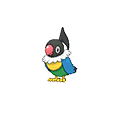

(550) raichu, 0.0013418820060752462


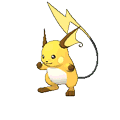

(579) salamence, 0.0013397441526796514


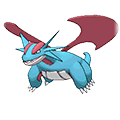

(310) horsea, 0.0013336903034413183


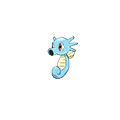

(639) slowpoke, 0.0013321235878482529


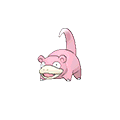

(236) gabite, 0.0013303983103698713


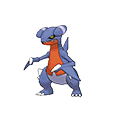

(302) hitmonlee, 0.001325491387649338


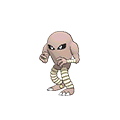

(611) shellder, 0.0013254236294110637


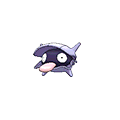

(511) pichu, 0.001323867021521621


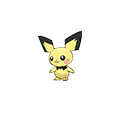

(99) cherubi, 0.001310532055468618


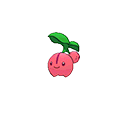

(421) marshtomp, 0.0013097117899036027


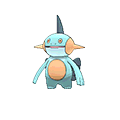

(44) beedrill, 0.0013072312318478114


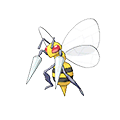

(36) banette, 0.0013060108222384124


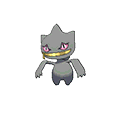

(101) chespin, 0.0013017793473999457


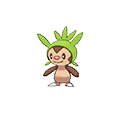

(72) buizel, 0.0012971934354607364


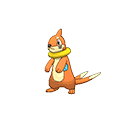

(406) makuhita, 0.0012941657119521616


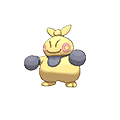

(327) joltik, 0.001293674936945673


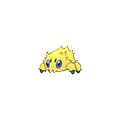

(691) talonflame, 0.0012839442601612662


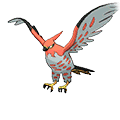

(613) shelmet, 0.0012807500895673143


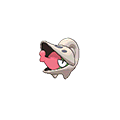

(464) natu, 0.0012807204946203529


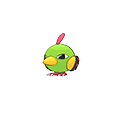

(643) smoochum, 0.0012741270398647566


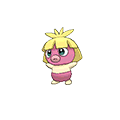

(181) duosion, 0.0012738858311319608


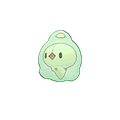

(135) croconaw, 0.0012712851153060852


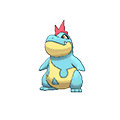

(488) oricorio-baile, 0.0012712168782560468


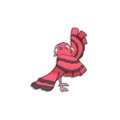

(510) phione, 0.0012664989593624742


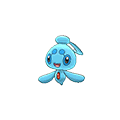

(120) comfey, 0.0012616863485288502


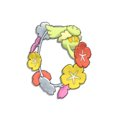

(251) glaceon, 0.0012611125097408214


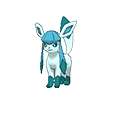

(270) gothorita, 0.0012536968166599004


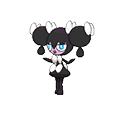

(405) magnezone, 0.0012489611928745736


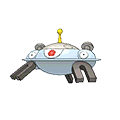

(775) weezing, 0.001247278544920311


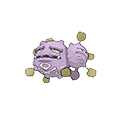

(133) croagunk, 0.00124618787611506


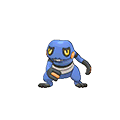

(116) cobalion, 0.0012457984462487628


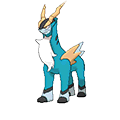

(46) beldum, 0.0012454937393582247


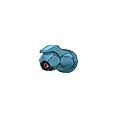

(41) bayleef, 0.0012413832990785


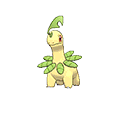

(2) absol, 0.0012385202542539418


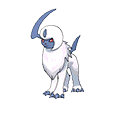

(307) hoopa-confined, 0.001236863310968072


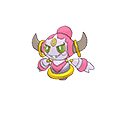

(19) arceus, 0.0012366708716228746


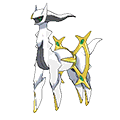

(793) yamask, 0.0012366626758526134


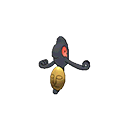

(85) carvanha, 0.0012362781691315707


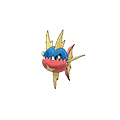

(636) sliggoo, 0.0012280870159059247


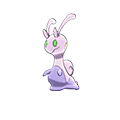

(333) kakuna, 0.001225881248775999


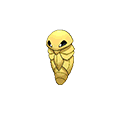

(415) maractus, 0.0012253283643995601


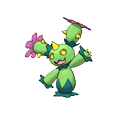

(268) gothita, 0.0012247770512926128


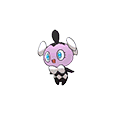

(311) houndoom, 0.0012245552097635865


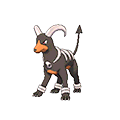

(281) grumpig, 0.001223827191052274


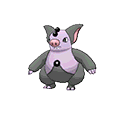

(654) spewpa, 0.001221418921127962


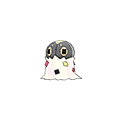

(792) xurkitree, 0.0012205345108480372


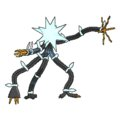

(410) mandibuzz, 0.0012185859943731902


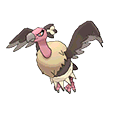

(687) swirlix, 0.0012174573226703342


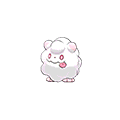

(541) pupitar, 0.0012157115727165389


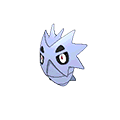

(650) solgaleo, 0.0012154236040581529


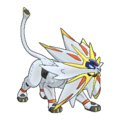

(159) diancie, 0.0012150537075417442


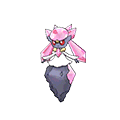

(686) swinub, 0.0012148428546461866


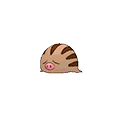

(321) ivysaur, 0.0012108935326389598


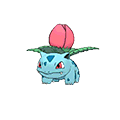

(393) lycanroc-midday, 0.001207958305210903


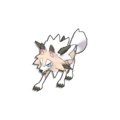

(298) herdier, 0.001205705163536167


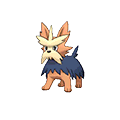

(566) rhydon, 0.0012045646754477207


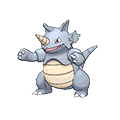

(292) haxorus, 0.0012019765307032541


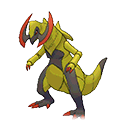

(648) snover, 0.0012011860540399942


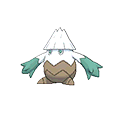

(726) trubbish, 0.0011998720983354442


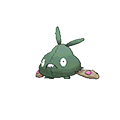

(400) magikarp, 0.0011988557398300292


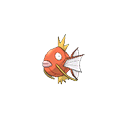

(84) carracosta, 0.0011986901822815942


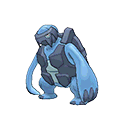

(540) pumpkaboo-average, 0.0011984256468736472


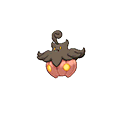

(548) quilladin, 0.0011980797280254848


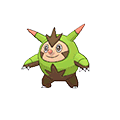

(130) cranidos, 0.0011976618524269424


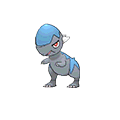

(462) musharna, 0.0011975843485480602


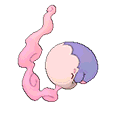

(719) toxapex, 0.0011941129239185569


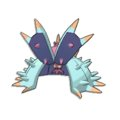

(332) kadabra, 0.0011929675194831332


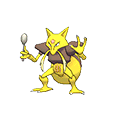

(373) lilligant, 0.0011905967481274492


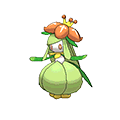

(151) delibird, 0.00119053246639863


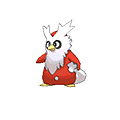

(567) rhyhorn, 0.0011894040099305115


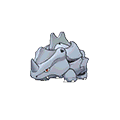

(396) machop, 0.0011887220047936038


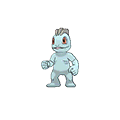

(638) slowking, 0.001187443208733904


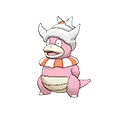

(642) smeargle, 0.001184090998935921


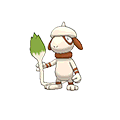

(444) mimikyu, 0.0011827097498076638


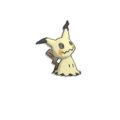

(456) mudkip, 0.0011815970492083396


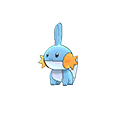

(160) diggersby, 0.0011810586212167786


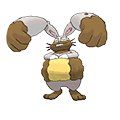

(789) wynaut, 0.0011808575623286682


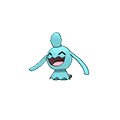

(273) graveler, 0.0011791933991431667


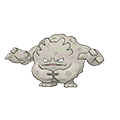

(359) lanturn, 0.0011786115821634789


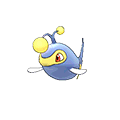

(419) marowak, 0.001178495651782758


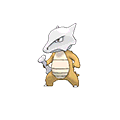

(379) lombre, 0.0011776018406343901


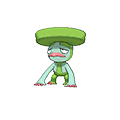

(338) keldeo-ordinary, 0.0011756284759763904


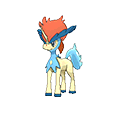

(748) venipede, 0.001173943087398627


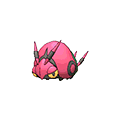

(354) kyogre, 0.0011725650389411402


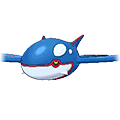

(14) ampharos, 0.0011715566659774071


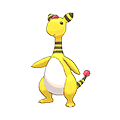

(220) fletchinder, 0.0011712062930363907


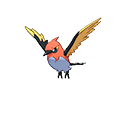

(728) tsareena, 0.001170599203131244


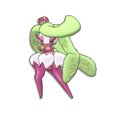

(104) chimecho, 0.0011675300203856857


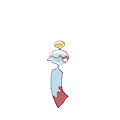

(478) noivern, 0.0011649751843758676


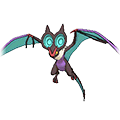

(466) nidoking, 0.0011642002177411383


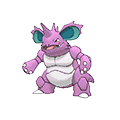

(339) kingdra, 0.0011618861845073426


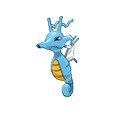

(524) poipole, 0.0011600057200430273


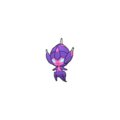

(75) bunnelby, 0.0011599357646680938


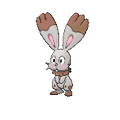

(366) leavanny, 0.0011597916275146913


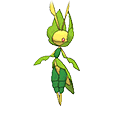

(631) skorupi, 0.0011587943873162191


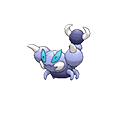

(740) unfezant, 0.0011526407022475875


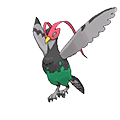

(255) gliscor, 0.0011494294165873766


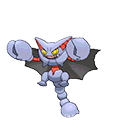

(675) sudowoodo, 0.0011482046616892094


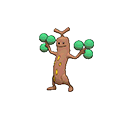

(79) cacnea, 0.0011479845716507902


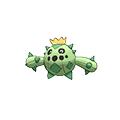

(81) camerupt, 0.0011377703625818087


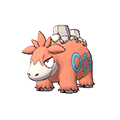

(553) rampardos, 0.0011369139951267165


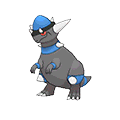

(482) octillery, 0.0011368885683365761


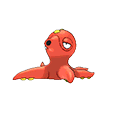

(782) wingull, 0.0011365082001988465


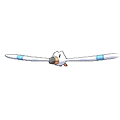

(392) luxray, 0.0011357286031820097


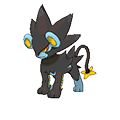

(531) popplio, 0.0011355745908539115


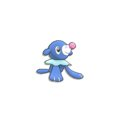

(53) binacle, 0.0011313651383851016


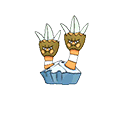

(301) hitmonchan, 0.001130792061551127


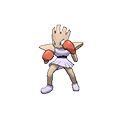

(335) karrablast, 0.0011304309350848418


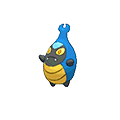

(43) beautifly, 0.0011297835104815308


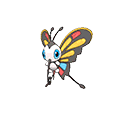

(296) helioptile, 0.001123647156865704


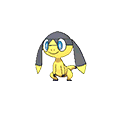

(731) tympole, 0.0011229746003134104


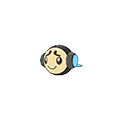

(512) pidgeot, 0.0011192547744995616


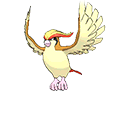

(88) caterpie, 0.0011129932133628418


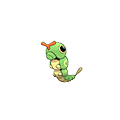

(221) fletchling, 0.001104170499356025


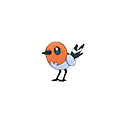

(497) pansage, 0.0010988747079400663


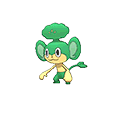

(580) salandit, 0.0010981139859982613


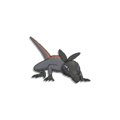

(214) ferroseed, 0.0010977212083326188


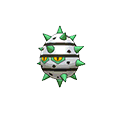

(788) wurmple, 0.0010964484389501896


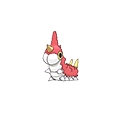

(377) litten, 0.001095849062024224


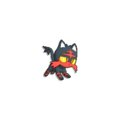

(191) ekans, 0.0010956507264501814


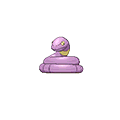

(800) zebstrika, 0.001093389858651192


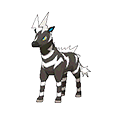

(195) electrode, 0.0010917624269194538


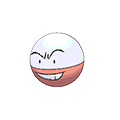

(666) starly, 0.0010915579468267766


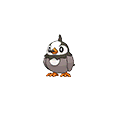

(615) shiftry, 0.0010914621731427409


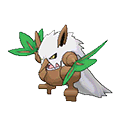

(695) tapu-fini, 0.0010885607465481147


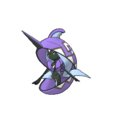

(779) whismur, 0.0010880043229416552


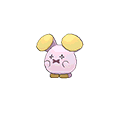

(641) slurpuff, 0.0010877440916639346


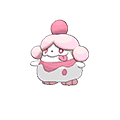

(56) blastoise, 0.0010850722597975338


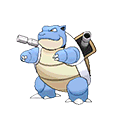

(791) xerneas, 0.0010846960852204392


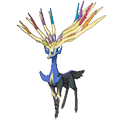

(431) meowth, 0.001084313783526698


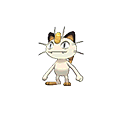

(10) altaria, 0.001084271250591662


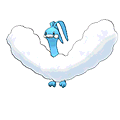

(659) spoink, 0.001083804237209435


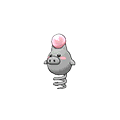

(390) luvdisc, 0.001082424087314171


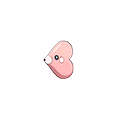

(725) tropius, 0.0010823180293684528


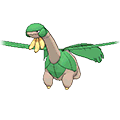

(71) budew, 0.001081974434907623


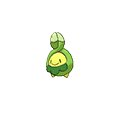

(261) golem, 0.001081353964364233


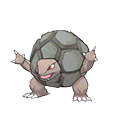

(180) dunsparce, 0.0010813460734910834


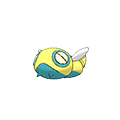

(362) larvitar, 0.0010795896611856173


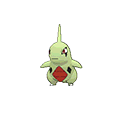

(164) doduo, 0.0010788085612302193


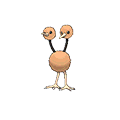

(238) galvantula, 0.001078287161958022


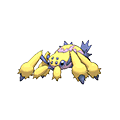

(162) ditto, 0.0010778569993693454


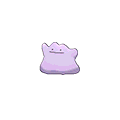

(234) furfrou, 0.0010772686327466248


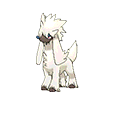

(201) entei, 0.0010769740264251729


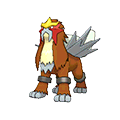

(143) darmanitan-standard, 0.001076285495691211


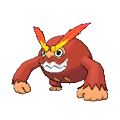

(754) victini, 0.001076083308167166


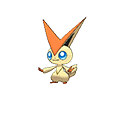

(266) goomy, 0.0010753717105570775


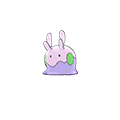

(286) gyarados, 0.0010746820932680157


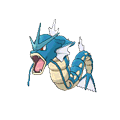

(783) wishiwashi-solo, 0.0010705775313713623


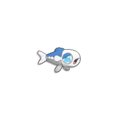

(776) whimsicott, 0.0010670951002328482


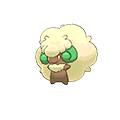

(552) ralts, 0.001066812325063258


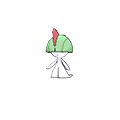

(538) probopass, 0.0010664673379646285


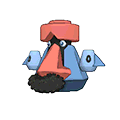

(766) vulpix, 0.0010663509119692124


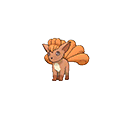

(533) porygon, 0.001066056252348824


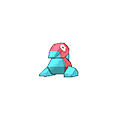

(458) muk, 0.0010641911380381563


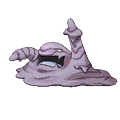

(506) petilil, 0.0010634340511921556


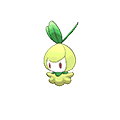

(402) magmortar, 0.0010633235490482293


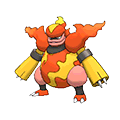

(414) mantyke, 0.0010629452790733918


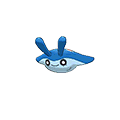

(797) yveltal, 0.001061994054588654


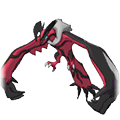

(590) sceptile, 0.0010578608007283865


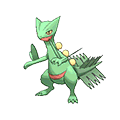

(278) grovyle, 0.001057134154494398


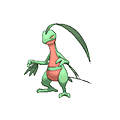

(161) diglett, 0.0010544847657594735


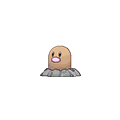

(282) gulpin, 0.0010540288932555195


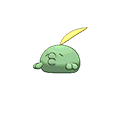

(196) elekid, 0.001049474483590468


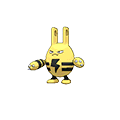

(739) umbreon, 0.001049308394120464


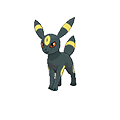

(500) parasect, 0.0010492370167974377


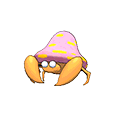

(469) nidoran-m, 0.0010462701284808162


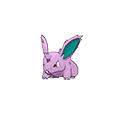

(244) genesect, 0.0010443005318224992


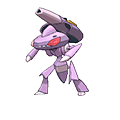

(708) togedemaru, 0.0010423630461428252


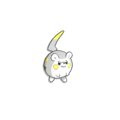

(306) honedge, 0.001041304314254603


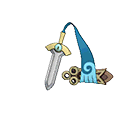

(700) tentacool, 0.0010404128986624644


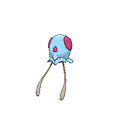

(411) manectric, 0.0010384186787631522


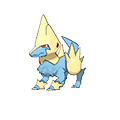

(369) lickilicky, 0.0010361143590024875


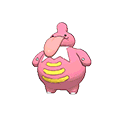

(629) skiploom, 0.0010357738958114994


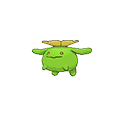

(35) baltoy, 0.0010348943560798119


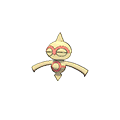

(770) wartortle, 0.0010348307227511


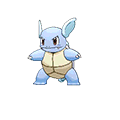

(50) bewear, 0.0010304495080012918


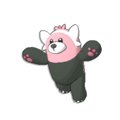

(786) wooper, 0.001029750207054467


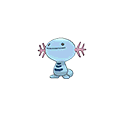

(785) woobat, 0.001027830047102226


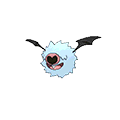

(363) latias, 0.0010257073780645704


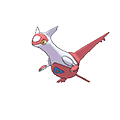

(341) kirlia, 0.0010254320325663556


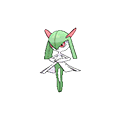

(614) shieldon, 0.0010253415819585535


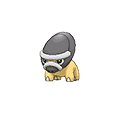

(647) snorunt, 0.0010228487330621525


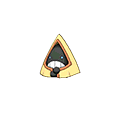

(717) totodile, 0.001021806107198721


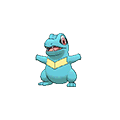

(501) passimian, 0.0010208757305750855


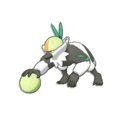

(607) sharpedo, 0.001020422420065731


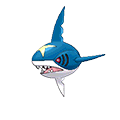

(568) rhyperior, 0.001016603498934577


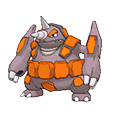

(560) regirock, 0.0010162522709342779


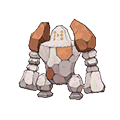

(422) masquerain, 0.0010157012309852873


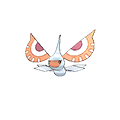

(438) mienfoo, 0.0010151143810838027


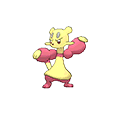

(640) slugma, 0.0010145535127233094


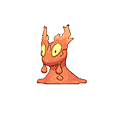

(426) meganium, 0.0010126497814663144


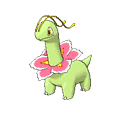

(513) pidgeotto, 0.0010118109977741538


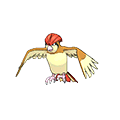

(514) pidgey, 0.0010105058563919522


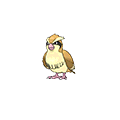

(303) hitmontop, 0.0010069683978127504


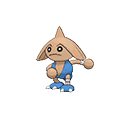

(144) dartrix, 0.0010062435104511856


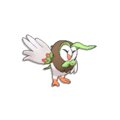

(106) chingling, 0.0010034275206237033


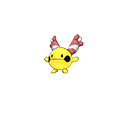

(547) quilava, 0.0010010655772767817


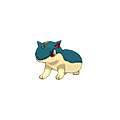

(445) minccino, 0.0009961182822272598


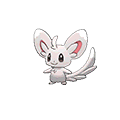

(594) scraggy, 0.0009950090986754277


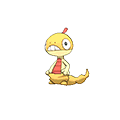

(778) whiscash, 0.0009935103745544389


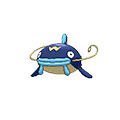

(544) pyroar, 0.000992954181321561


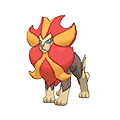

(5) aerodactyl, 0.000992389762075605


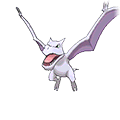

(503) pawniard, 0.0009909469278643003


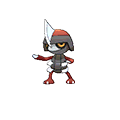

(773) weedle, 0.0009906240251454767


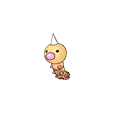

(265) goodra, 0.0009837154255667125


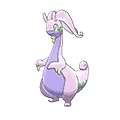

(228) forretress, 0.0009806310496279622


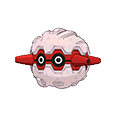

(21) archeops, 0.000973220913186933


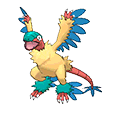

(87) castform, 0.0009720858027416939


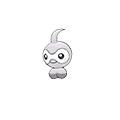

(733) type-null, 0.0009715676858391069


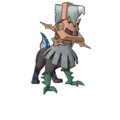

(465) necrozma, 0.0009710016829446507


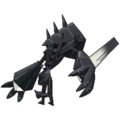

(139) cubone, 0.0009691005763506958


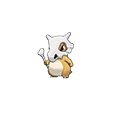

(443) mime-jr, 0.0009689298906667632


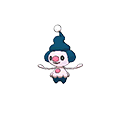

(312) houndour, 0.0009674142349217452


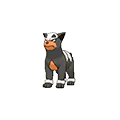

(711) togetic, 0.0009662843467841676


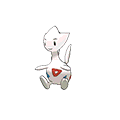

(494) pancham, 0.0009636682702620111


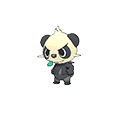

(189) eelektross, 0.0009632381192681151


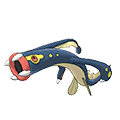

(110) clawitzer, 0.0009608847100791777


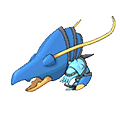

(355) kyurem, 0.0009598523518243997


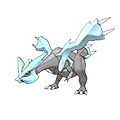

(11) amaura, 0.0009592800008331591


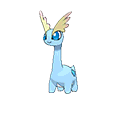

(114) cleffa, 0.0009591484771778931


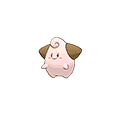

(718) toucannon, 0.0009586751316099599


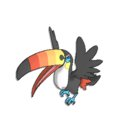

(203) espeon, 0.0009586609672126519


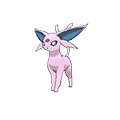

(634) slaking, 0.0009565433701983698


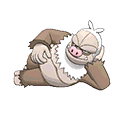

(784) wobbuffet, 0.0009557663067243195


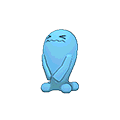

(342) klang, 0.0009555284901532526


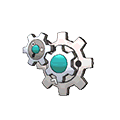

(671) stoutland, 0.0009551473662528546


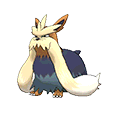

(6) aggron, 0.0009549450726361629


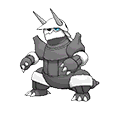

(581) salazzle, 0.0009533339910549644


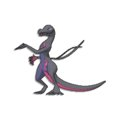

(100) chesnaught, 0.0009531862044315539


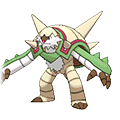

(603) serperior, 0.0009528463043381912


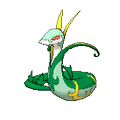

(108) clamperl, 0.0009523027361891499


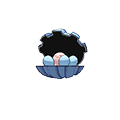

(345) klinklang, 0.0009511071934616285


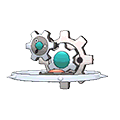

(679) surskit, 0.0009509215030214255


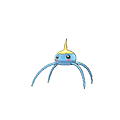

(630) skitty, 0.0009506896288758171


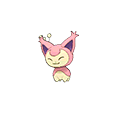

(376) litleo, 0.000950581066481247


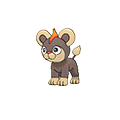

(495) pangoro, 0.0009503506226940798


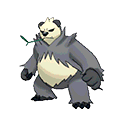

(78) buzzwole, 0.0009498082624571631


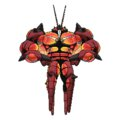

(515) pidove, 0.0009497593128906678


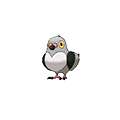

(177) druddigon, 0.0009492747818124232


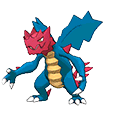

(680) swablu, 0.0009487510610097583


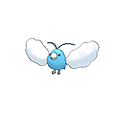

(491) palkia, 0.0009487403941894808


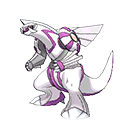

(663) stantler, 0.0009481498909910489


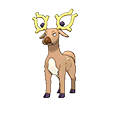

(423) mawile, 0.0009481112302873765


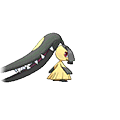

(448) misdreavus, 0.0009475784215776715


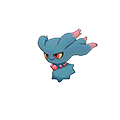

(476) noctowl, 0.0009461797006873882


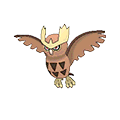

(535) primarina, 0.0009445405466234464


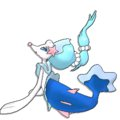

(158) dialga, 0.0009445160072458341


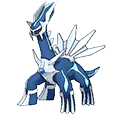

(517) pikachu, 0.0009443759823232899


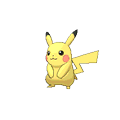

(57) blaziken, 0.0009441890084301709


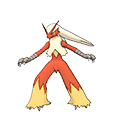

(557) rayquaza, 0.0009428296179116307


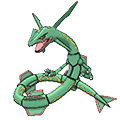

(669) steelix, 0.000941466092458089


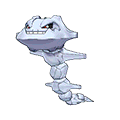

(729) turtonator, 0.000941054751171516


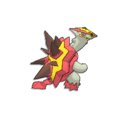

(361) larvesta, 0.0009402913802594396


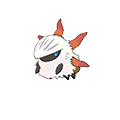

(575) rotom, 0.0009394644203560225


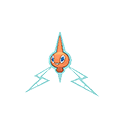

(682) swalot, 0.0009392527624931809


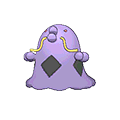

(749) venomoth, 0.0009390296592192948


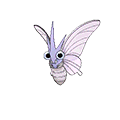

(774) weepinbell, 0.0009385418139998848


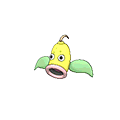

(753) vibrava, 0.000937565482934273


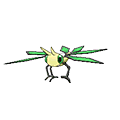

(209) farfetchd, 0.0009375437812098764


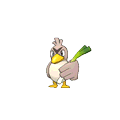

(676) suicune, 0.0009374051131073583


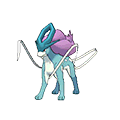

(111) claydol, 0.0009358432566763703


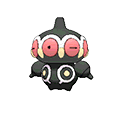

(219) flareon, 0.0009355801105211138


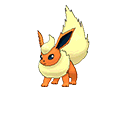

(182) durant, 0.000935334008861181


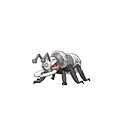

(76) burmy, 0.0009342926407461209


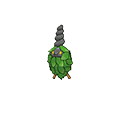

(543) purugly, 0.00093368302724735


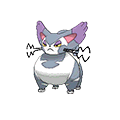

(707) tirtouga, 0.0009335092028804773


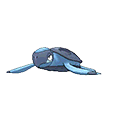

(323) jellicent, 0.0009334737887204852


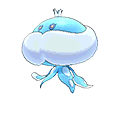

(475) ninjask, 0.0009333665779139003


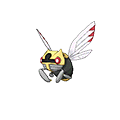

(732) tynamo, 0.0009331507407377914


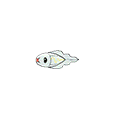

(694) tapu-bulu, 0.0009315261140856731


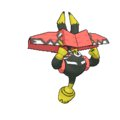

(205) excadrill, 0.0009314760947286213


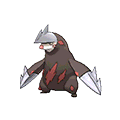

(619) shuckle, 0.0009310570057175319


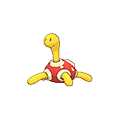

(596) seadra, 0.0009305629333769436


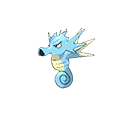

(356) lairon, 0.0009304255883799259


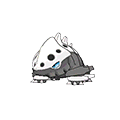

(267) gorebyss, 0.0009294917196829959


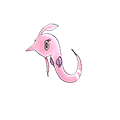

(140) cutiefly, 0.0009293717397354538


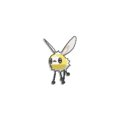

(305) honchkrow, 0.0009285575425215732


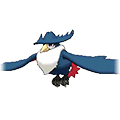

(588) sawsbuck, 0.0009277167113188881


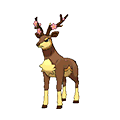

(744) vanillish, 0.0009275296057445132


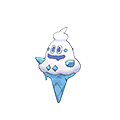

(82) carbink, 0.0009273588992642545


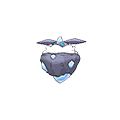

(131) crawdaunt, 0.00092640392913601


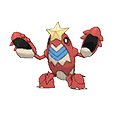

(652) solrock, 0.0009247552818021406


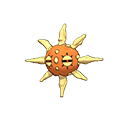

(40) bastiodon, 0.0009246347936117537


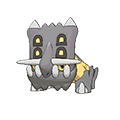

(429) meltan, 0.0009225247827740515


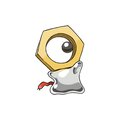

(420) marshadow, 0.0009222521100904072


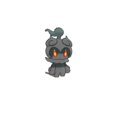

(65) braviary, 0.0009200407534263116


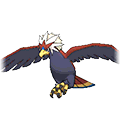

(132) cresselia, 0.0009199606626240803


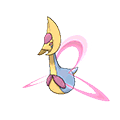

(381) lotad, 0.0009192360074921134


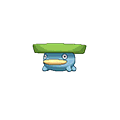

(370) lickitung, 0.0009185401380537759


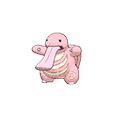

(483) oddish, 0.0009183011949726451


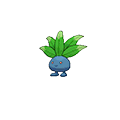

(202) escavalier, 0.0009176778136531364


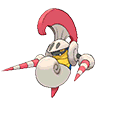

(714) tornadus-incarnate, 0.0009172697427922533


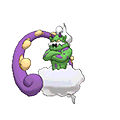

(237) gallade, 0.0009169799510436144


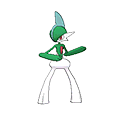

(239) garbodor, 0.0009165603458162813


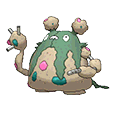

(325) jirachi, 0.0009164013635558782


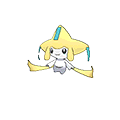

(290) haunter, 0.000915877126479234


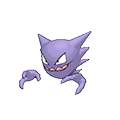

(705) thundurus-incarnate, 0.0009157783943971013


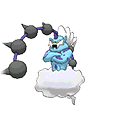

(486) onix, 0.00091488834671845


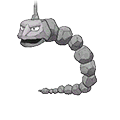

(528) poliwrath, 0.0009141603737103694


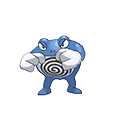

(232) frogadier, 0.0009139575517564693


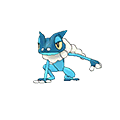

(33) azurill, 0.0009138526202961903


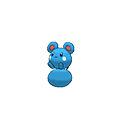

(407) malamar, 0.0009115790657155748


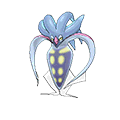

(49) bergmite, 0.0009114882249442062


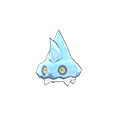

(358) landorus-incarnate, 0.0009112564720367457


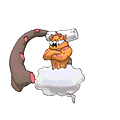

(417) mareep, 0.0009100667512240431


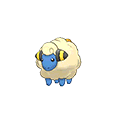

(734) typhlosion, 0.0009099695329807142


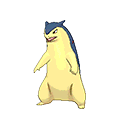

(698) tauros, 0.0009097851489438468


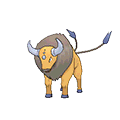

(455) mudbray, 0.0009095727473051321


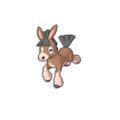

(781) wimpod, 0.0009091734757436464


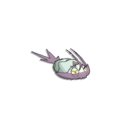

(667) starmie, 0.0009083382505651596


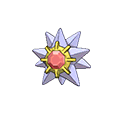

(447) minun, 0.0009061240697599431


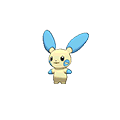

(430) meowstic-male, 0.0009057004408565717


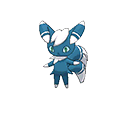

(178) ducklett, 0.0009050082511372038


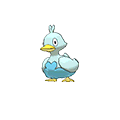

(537) prinplup, 0.0009046017839829624


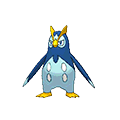

(556) rattata, 0.0009045924623556143


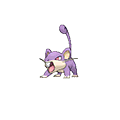

(55) blacephalon, 0.0009043821657410514


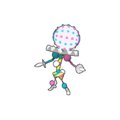

(328) jumpluff, 0.00090093996601623


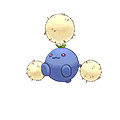

(637) slowbro, 0.0009008731667354426


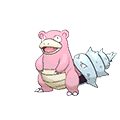

(378) litwick, 0.0009003539071584045


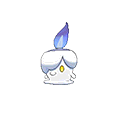

(12) ambipom, 0.0008993960716884778


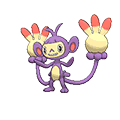

(7) aipom, 0.0008985140226366323


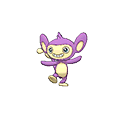

(394) machamp, 0.0008978448238517035


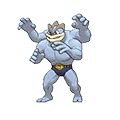

(163) dodrio, 0.0008975352764159041


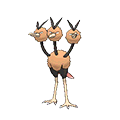

(703) terrakion, 0.0008971398601628244


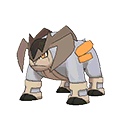

(795) yanmega, 0.0008960026558073773


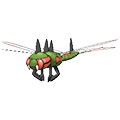

(452) morelull, 0.0008956662875821846


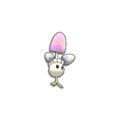

(170) drampa, 0.0008954538401324974


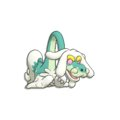

(382) loudred, 0.0008931773849683199


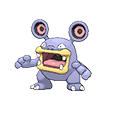

(176) drowzee, 0.0008914507617994837


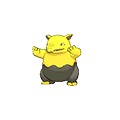

(742) ursaring, 0.0008897658463494859


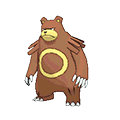

(145) darumaka, 0.0008886639294272812


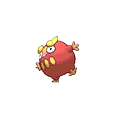

(432) mesprit, 0.0008886110467203608


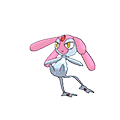

(656) spinarak, 0.0008883023716244852


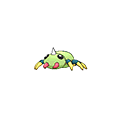

(315) hypno, 0.0008873209889794038


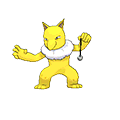

(751) venusaur, 0.0008853525466886041


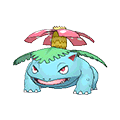

(94) charjabug, 0.0008847200831171244


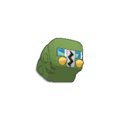

(372) lileep, 0.0008832404407135162


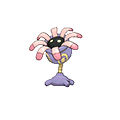

(1) abra, 0.000881151107555456


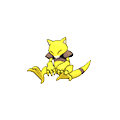

(208) exploud, 0.0008809561465943643


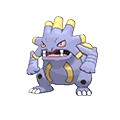

(129) cradily, 0.0008799022914881551


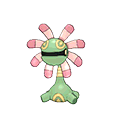

(20) archen, 0.0008781605730112001


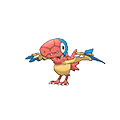

(173) drifblim, 0.0008779559600492821


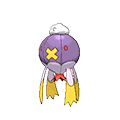

(365) leafeon, 0.0008764747235670684


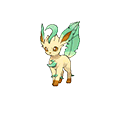

(496) panpour, 0.0008680625935186198


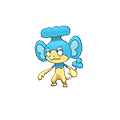

(23) armaldo, 0.0008673593694835106


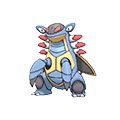

(424) medicham, 0.0008672968142690077


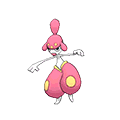

(308) hoothoot, 0.0008657074341891293


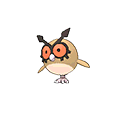

(762) volcanion, 0.000865596111572325


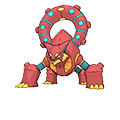

(681) swadloon, 0.0008653931053518286


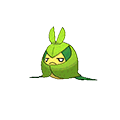

(360) lapras, 0.0008649160177441827


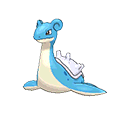

(760) vivillon, 0.0008632394723792482


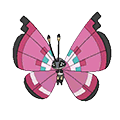

(529) ponyta, 0.00086235845039708


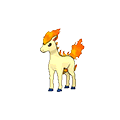

(168) dragonair, 0.0008614041645860928


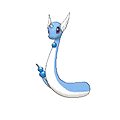

(229) fraxure, 0.0008568572335520409


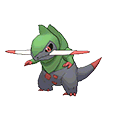

(364) latios, 0.0008558185067695938


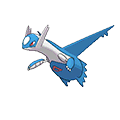

(690) taillow, 0.0008545644833276955


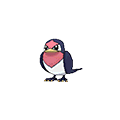

(657) spinda, 0.0008542042845180876


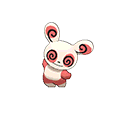

(206) exeggcute, 0.0008535643927351279


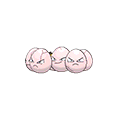

(554) rapidash, 0.0008527082770659409


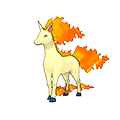

(246) geodude, 0.0008517876047835905


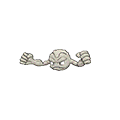

(98) cherrim, 0.0008506181246589229


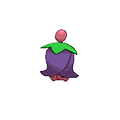

(627) skarmory, 0.0008502354230950637


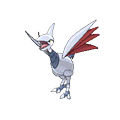

(685) swellow, 0.0008497016604062603


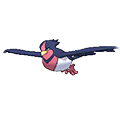

(564) reshiram, 0.0008478114264994294


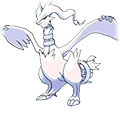

(757) vikavolt, 0.0008476921908888023


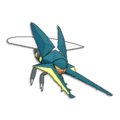

(463) naganadel, 0.0008451074945190315


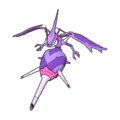

(437) mewtwo, 0.0008444370884254275


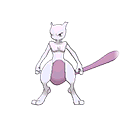

(674) stunky, 0.0008439852774618055


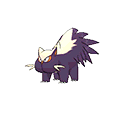

(107) cinccino, 0.0008439739364881567


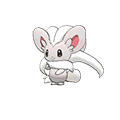

(215) ferrothorn, 0.0008428208747535396


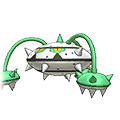

(90) celesteela, 0.0008427953870058707


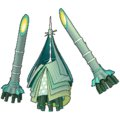

(59) blitzle, 0.0008414124453731105


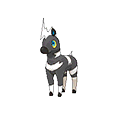

(167) dragalge, 0.0008405081451952521


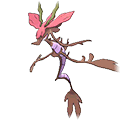

(633) skuntank, 0.0008387578587802623


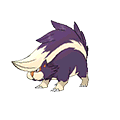

(58) blissey, 0.0008385811594243997


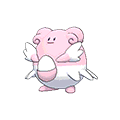

(709) togekiss, 0.0008384242966533537


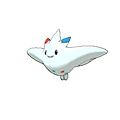

(436) mew, 0.0008365796173003655


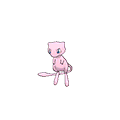

(197) elgyem, 0.0008337193900926549


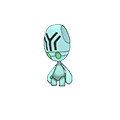

(172) dratini, 0.0008331480378730614


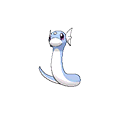

(555) raticate, 0.0008330169001174352


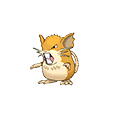

(504) pelipper, 0.0008327724059400881


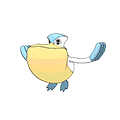

(86) cascoon, 0.0008317885223856484


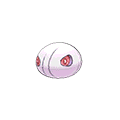

(428) meloetta-aria, 0.0008315735733040751


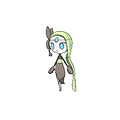

(693) tangrowth, 0.0008313976221415492


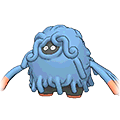

(227) foongus, 0.0008311080338682054


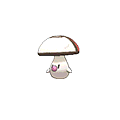

(745) vanillite, 0.0008299330682899793


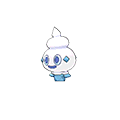

(623) silvally, 0.0008294751087545443


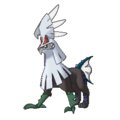

(38) barboach, 0.0008293828228715081


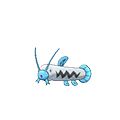

(727) trumbeak, 0.0008289238784457121


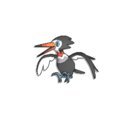

(799) zapdos, 0.0008285468602992049


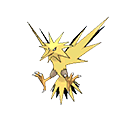

(509) pheromosa, 0.000828415429484793


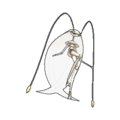

(272) granbull, 0.0008283250080632209


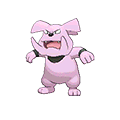

(622) silcoon, 0.000827379870918946


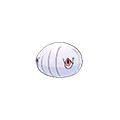

(413) mantine, 0.0008273547283169922


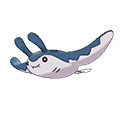

(385) lugia, 0.0008272356906066482


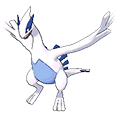

(646) snorlax, 0.0008269059459313921


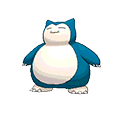

(42) beartic, 0.0008267362931551475


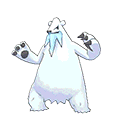

(92) chansey, 0.0008255960284207784


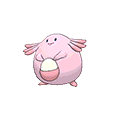

(592) scolipede, 0.0008252437620017473


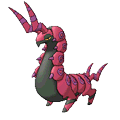

(26) articuno, 0.000824828012686245


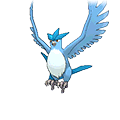

(582) samurott, 0.0008241106018229618


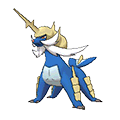

(433) metagross, 0.0008236956818287077


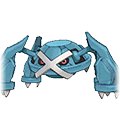

(741) unown, 0.000822694877229812


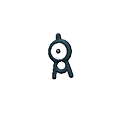

(249) girafarig, 0.0008224398117569206


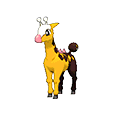

(665) staravia, 0.0008221016236211775


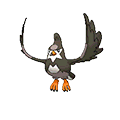

(285) guzzlord, 0.000821690060240631


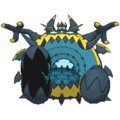

(324) jigglypuff, 0.000820668778359938


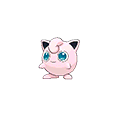

(664) staraptor, 0.000820524829107288


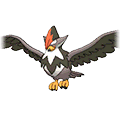

(121) conkeldurr, 0.0008203679265860863


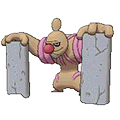

(521) pinsir, 0.0008200549139246262


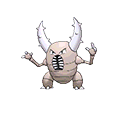

(569) ribombee, 0.0008200334917138826


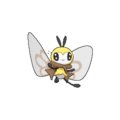

(334) kangaskhan, 0.0008198987361788214


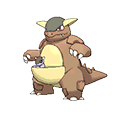

(28) aurorus, 0.0008193169400515178


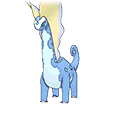

(235) furret, 0.0008190365916555906


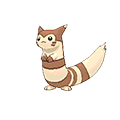

(427) melmetal, 0.0008185021220324861


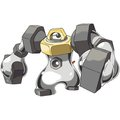

(183) dusclops, 0.0008183509472790518


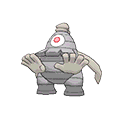

(585) sandslash, 0.0008181797910648044


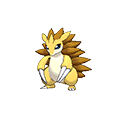

(768) wailord, 0.0008174308216152449


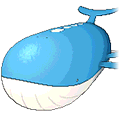

(252) glalie, 0.0008173745603305042


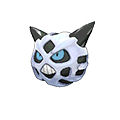

(137) cryogonal, 0.0008167417496443934


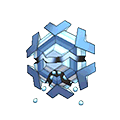

(474) ninetales, 0.0008164767844160395


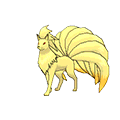

(192) electabuzz, 0.0008163015603331658


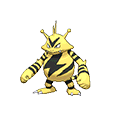

(222) floatzel, 0.0008162734820540158


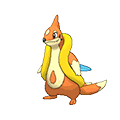

(769) walrein, 0.0008149386048461685


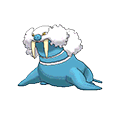

(412) mankey, 0.0008145514920051987


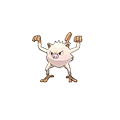

(264) golurk, 0.0008144518048297365


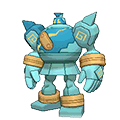

(288) happiny, 0.0008143351307658162


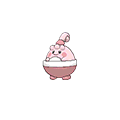

(62) bouffalant, 0.0008143077541844848


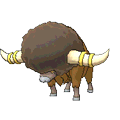

(439) mienshao, 0.0008129966686491589


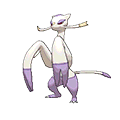

(767) wailmer, 0.0008122113820865311


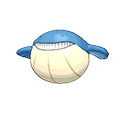

(546) quagsire, 0.0008121993617985738


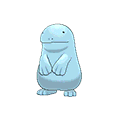

(518) pikipek, 0.000811177215587035


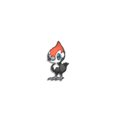

(166) doublade, 0.000810168957889179


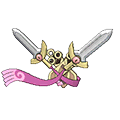

(300) hippowdon, 0.000809928640822841


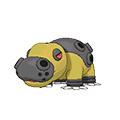

(318) incineroar, 0.0008097762562206908


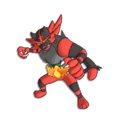

(210) fearow, 0.0008093968721051216


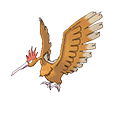

(68) bronzong, 0.0008093567641228214


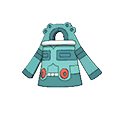

(602) sentret, 0.0008092825885290714


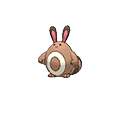

(271) gourgeist-average, 0.0008087946164590373


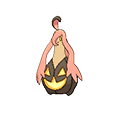

(471) nidorino, 0.0008086727195879638


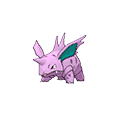

(545) pyukumuku, 0.000808106425523515


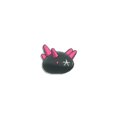

(684) swanna, 0.0008080723217955516


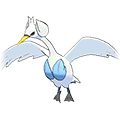

(403) magnemite, 0.0008079033772153761


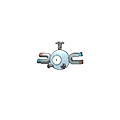

(387) lunala, 0.0008078754289378967


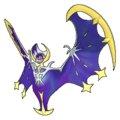

(16) araquanid, 0.0008076588095021699


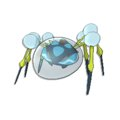

(586) sandygast, 0.0008074713086427056


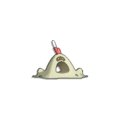

(263) golisopod, 0.0008065916935339694


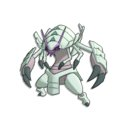

(353) krookodile, 0.000806470950318402


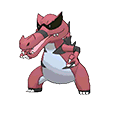

(74) buneary, 0.0008064654123569007


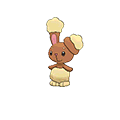

(274) greninja, 0.000806383932161789


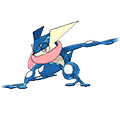

(13) amoonguss, 0.0008057930060227061


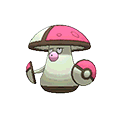

(258) golbat, 0.0008054283427668025


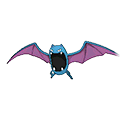

(645) snivy, 0.0008049006248097332


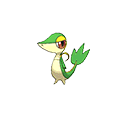

(190) eevee, 0.0008047294878113806


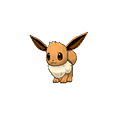

(344) klink, 0.0008033821532944227


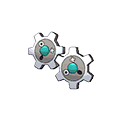

(561) registeel, 0.0008033269806570111


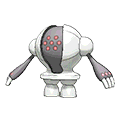

(83) carnivine, 0.0008029882595772048


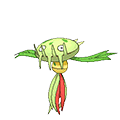

(572) roggenrola, 0.0008027949455922425


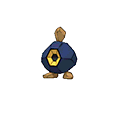

(635) slakoth, 0.0008025757061664953


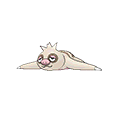

(165) donphan, 0.0008025567260472248


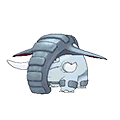

(17) arbok, 0.0008023848818199078


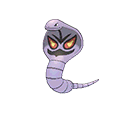

(701) tentacruel, 0.0008022936539199023


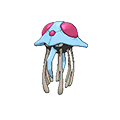

(280) grubbin, 0.0008019217584901483


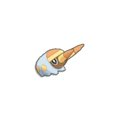

(747) vaporeon, 0.0008013374612454462


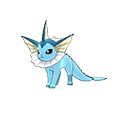

(153) deoxys-normal, 0.0008009717743274065


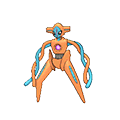

(609) shedinja, 0.0008005511019027389


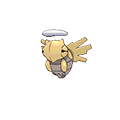

(473) nincada, 0.0008003814298935699


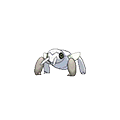

(96) charmeleon, 0.000800348184320394


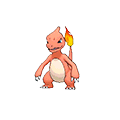

(115) cloyster, 0.0008001051218004404


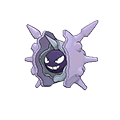

(269) gothitelle, 0.0007999082466057645


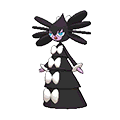

(764) voltorb, 0.0007998492023289963


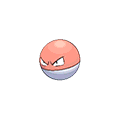

(457) mudsdale, 0.0007997326341801221


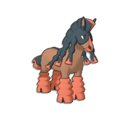

(127) crabominable, 0.0007993699563525937


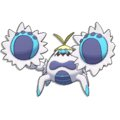

(169) dragonite, 0.0007990620361650637


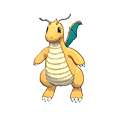

(39) basculin-red-striped, 0.0007983469237645183


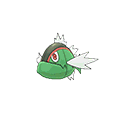

(536) primeape, 0.000797785151740783


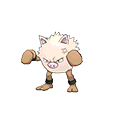

(102) chikorita, 0.0007976039586141282


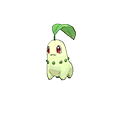

(154) dewgong, 0.0007975966581140685


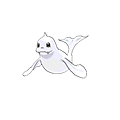

(207) exeggutor, 0.0007971270509741747


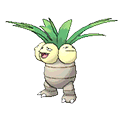

(604) servine, 0.0007963360009362108


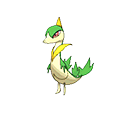

(449) mismagius, 0.0007955508199508827


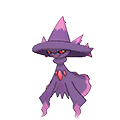

(758) vileplume, 0.0007952122288803405


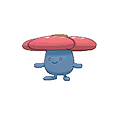

(780) wigglytuff, 0.0007947889784010152


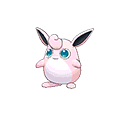

(721) tranquill, 0.0007947086328567676


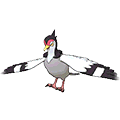

(174) drifloon, 0.000794552965308556


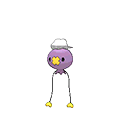

(193) electivire, 0.000793261456538965


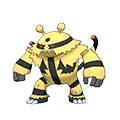

(48) bellsprout, 0.0007924165853277767


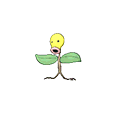

(558) regice, 0.0007922045524733234


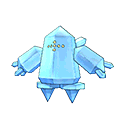

(668) staryu, 0.0007920625427830529


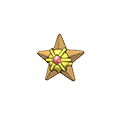

(184) dusknoir, 0.0007918100343615197


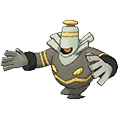

(204) espurr, 0.0007915390949756886


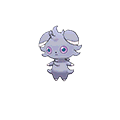

(375) linoone, 0.0007915166714708279


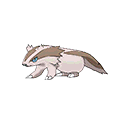

(446) minior-meteor, 0.0007908754261285328


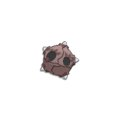

(142) darkrai, 0.000790253974561101


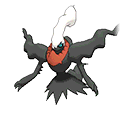

(704) throh, 0.000790069335698816


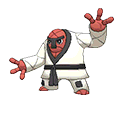

(314) hydreigon, 0.0007887993045546332


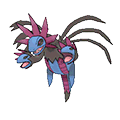

(408) mamoswine, 0.0007885300904325058


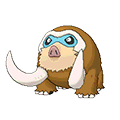

(805) zorua, 0.0007885239044301153


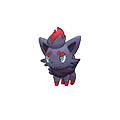

(331) kabutops, 0.0007884450103970847


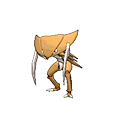

(188) eelektrik, 0.0007878143978530747


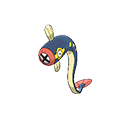

(320) inkay, 0.0007878123384178079


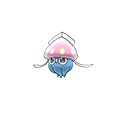

(340) kingler, 0.0007876036955758568


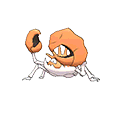

(755) victreebel, 0.0007874784967616751


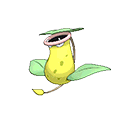

(152) delphox, 0.0007868191061614605


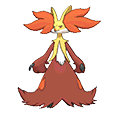

(257) gogoat, 0.0007866230362338716


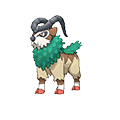

(492) palossand, 0.0007856048772797488


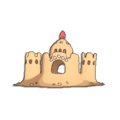

(241) gardevoir, 0.0007855489928827933


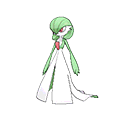

(655) spheal, 0.0007851184402733484


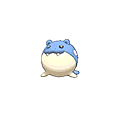

(254) gligar, 0.0007847331537430727


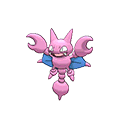

(808) zygarde-50, 0.0007845589497108721


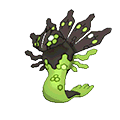

(240) garchomp, 0.0007832675341181307


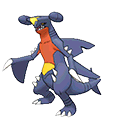

(399) magearna, 0.0007830038233137414


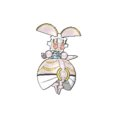

(559) regigigas, 0.0007828265014855548


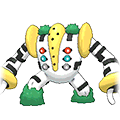

(678) sunkern, 0.0007826981795641663


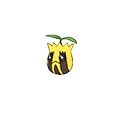

(549) qwilfish, 0.0007820322829981893


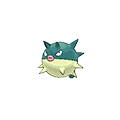

(0) abomasnow, 0.0007820155819588442


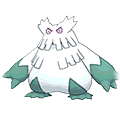

(283) gumshoos, 0.0007816421371441122


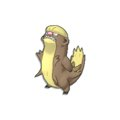

(735) tyranitar, 0.0007810755029911459


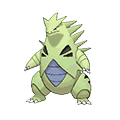

(330) kabuto, 0.0007804108000023708


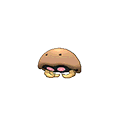

(565) reuniclus, 0.0007794735496018364


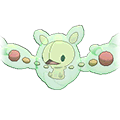

(481) nuzleaf, 0.0007777351205522302


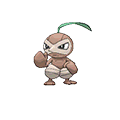

(150) delcatty, 0.0007771632616376894


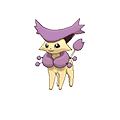

(259) goldeen, 0.0007771518722214492


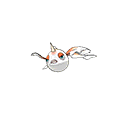

(357) lampent, 0.0007768209030134226


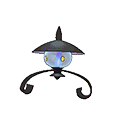

(124) cosmoem, 0.0007765184961514772


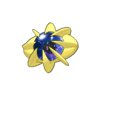

(60) boldore, 0.000776378828378851


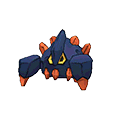

(77) butterfree, 0.000775970865779491


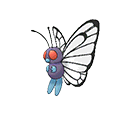

(527) poliwhirl, 0.0007756479917249082


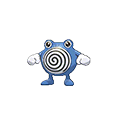

(171) drapion, 0.0007751906621914344


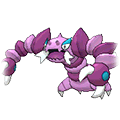

(349) krabby, 0.0007748093013176444


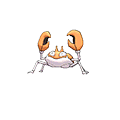

(383) lucario, 0.0007747187929312236


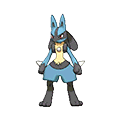

(32) azumarill, 0.0007737678153512642


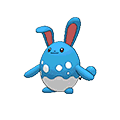

(777) whirlipede, 0.0007737656053547364


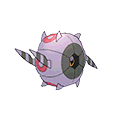

(61) bonsly, 0.0007733793800325227


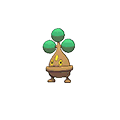

(485) omastar, 0.0007730702057000293


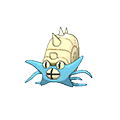

(89) celebi, 0.000772517028107135


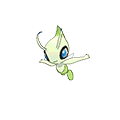

(22) ariados, 0.0007720677699937898


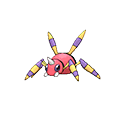

(136) crustle, 0.0007717184205091733


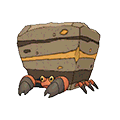

(710) togepi, 0.0007707768689473424


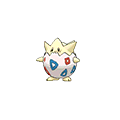

(616) shiinotic, 0.0007693348049105962


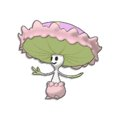

(461) murkrow, 0.000769324480574977


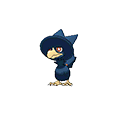

(125) cosmog, 0.0007684396255438746


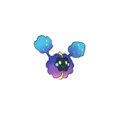

(798) zangoose, 0.0007678950695311486


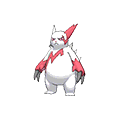

(218) flabebe, 0.0007677643826774072


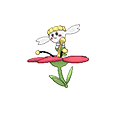

(91) chandelure, 0.0007667325356384633


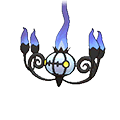

(319) infernape, 0.0007657815402491953


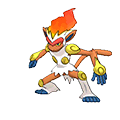

(597) seaking, 0.0007655225991300228


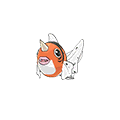

(148) deerling, 0.0007653370398636756


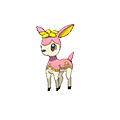

(157) dhelmise, 0.0007652845228222044


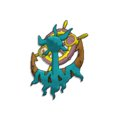

(404) magneton, 0.0007649659094505048


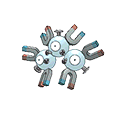

(662) stakataka, 0.0007646079808259151


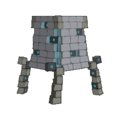

(790) xatu, 0.0007641119508692846


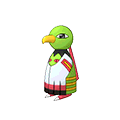

(15) anorith, 0.000763824197748949


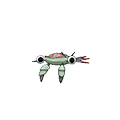

(442) miltank, 0.0007636187726531438


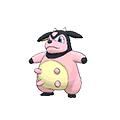

(18) arcanine, 0.0007635439589684379


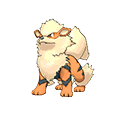

(37) barbaracle, 0.0007631221493715821


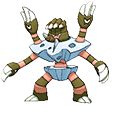

(247) gible, 0.0007625878581003407


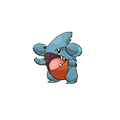

(230) frillish, 0.0007624276864983922


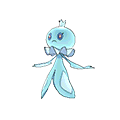

(532) porygon-z, 0.0007623690907777787


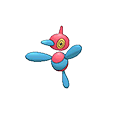

(716) torterra, 0.0007621868579192054


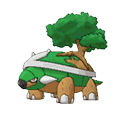

(343) klefki, 0.000760694601001518


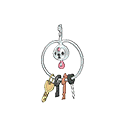

(70) bruxish, 0.0007603544519379376


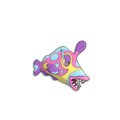

(484) omanyte, 0.0007599002431991873


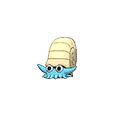

(211) feebas, 0.0007592673580320467


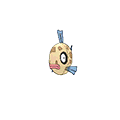

(67) brionne, 0.0007573745387171552


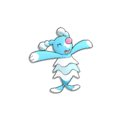

(697) tapu-lele, 0.0007572622715758072


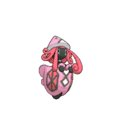

(605) seviper, 0.0007572202277403525


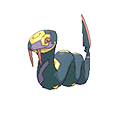

(598) sealeo, 0.0007568653088103094


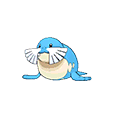

(526) poliwag, 0.0007566037019825603


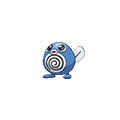

(289) hariyama, 0.0007552873657053778


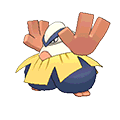

(454) mr-mime, 0.0007550677100978221


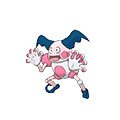

(117) cofagrigus, 0.0007545592477335751


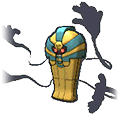

(262) golett, 0.0007541019678686583


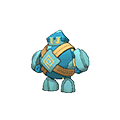

(233) froslass, 0.0007537017326015167


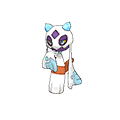

(277) groudon, 0.0007534917504658971


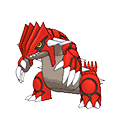

(692) tangela, 0.000752299925924174


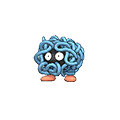

(489) oshawott, 0.0007518309278694593


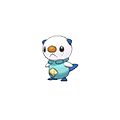

(601) seismitoad, 0.000751421498868457


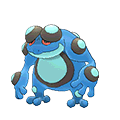

(584) sandshrew, 0.0007497037405894318


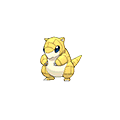

(313) huntail, 0.0007492457409111663


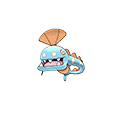

(118) combee, 0.0007481253019684683


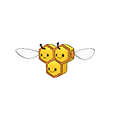

(713) torkoal, 0.0007471759163246129


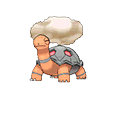

(250) giratina-altered, 0.0007464590470648684


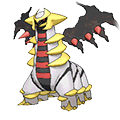

(621) sigilyph, 0.0007452774903346476


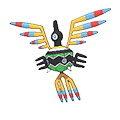

(787) wormadam-plant, 0.0007437659555643015


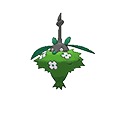

(453) mothim, 0.0007437507779496817


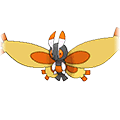

(248) gigalith, 0.0007422609464885956


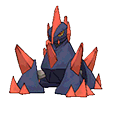

(29) avalugg, 0.0007418611932512695


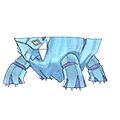

(398) magcargo, 0.0007386828411008601


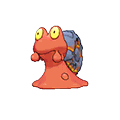

(291) hawlucha, 0.000738675082713857


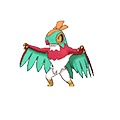

(771) watchog, 0.0007339612704358508


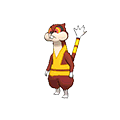

(374) lillipup, 0.0007337924802714224


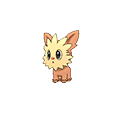

(309) hoppip, 0.0007331602313881975


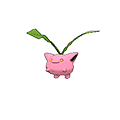

(368) ledyba, 0.0007300387334002324


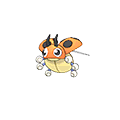

(276) grotle, 0.0007170424539391321


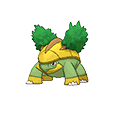

In [59]:
import networkx as nx
from IPython.display import Image

# we will use degree centrality to see 
# which are 
dc = nx.pagerank(g)
sorted_dc = sorted(dc.items(), key=lambda x: x[1], reverse=True) 

for node, dc_v in sorted_dc:
    pokemon = g.nodes[node]['attr_dict']['pokemon']
    path = g.nodes[node]['attr_dict']['path']
    print(f'({node}) {pokemon}, {dc_v}')
    display(Image(path))

# whats intresting to see is that the *more* central pokemons are *less* rare (based)
# on my knowledge when playing pokemon in my past and the *less* central are *more* rare.
# For example in the more central pokemon we can see: zubat, bulbasaur, psyduck
# and in the bottom part we can see much more rare pokemons such as: groudon, hawlucha, avalugg and more!
